# Brain Tumor Segmentaion

The goal in this notebook is to perform segmentation on gliomas in pre-operative MRI scans. The data comes fromthe BraTS 2018 challenge/
We use the provided clinically-acquired training data
to produce segmentation labels. <br>
There are 4 types of MRI images (they depend on the signal acquisition settings while taking the images): 

* T1: T1-weighted, native image, sagittal or axial 2D acquisitions, with 1–6 mm slice thickness.

* T1c: T1-weighted, contrast-enhanced (Gadolinium) image, with 3D acquisition and 1 mm isotropic voxel size for most patients.

* T2: T2-weighted image, axial 2D acquisition, with 2–6 mm slice thickness.

* FLAIR: T2-weighted FLAIR image, axial, coronal, or sagittal 2D acquisitions, 2–6 mm slice thickness.


They all highlight different types of tissues. <br>
Two types of gliomas are present in this dataset: High and Lower grade gliomas (see also the diagramme below). We have 210 images from high grade glioma and 75 images from low grade glioma. We also have the ground truth (validation data) corresponding to each image. 

##Tumor structures and annotation protocol

The information below describes what we are looking for in the brain and comes from [this IEEE paper](https://ieeexplore.ieee.org/document/6975210) on the subject. 

* GD-enhancing tumor (ET — label 4)
* Peritumoral edema (ED — label 2)
* Necrotic and non-enhancing tumor core (NCR/NET — label 1)
* Remaining Region (label 0)

Below image shows these regions and comes from this [kaggle contribution:](https://www.kaggle.com/tombrown123/3d-p-net-complete-code/data?select=BraTS2020_TrainingData)

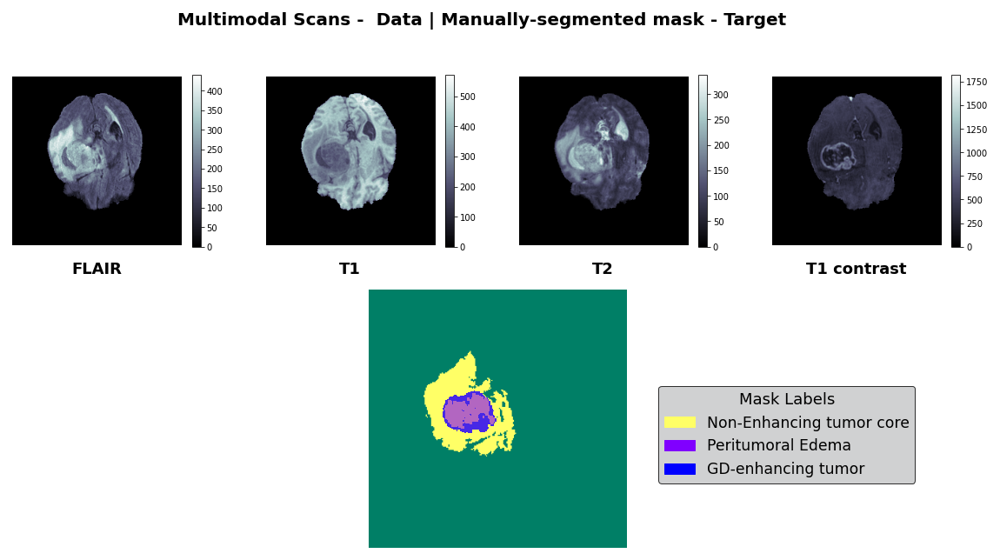

The data is upoloded in a read-only Google drive folder (which is not mine). A shortcut can be created to it from this [link](https://drive.google.com/drive/folders/1RSjZ6ASBMSPgUtFQAzvpBx1aW5VXPtAM?usp=sharing). For the moment "anyone on the internet can view" this data but in case of trouble I have a local copy from the TCGA-GBM.

##Connecting Google Drive

In [1]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Mon Dec 13 12:56:48 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P0    30W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


In [3]:
from google.colab import drive
import os
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [4]:
#this is the path to the shortcut I created on my own google drive
os.chdir('/content/drive/MyDrive/Dataset')

In [5]:
os.listdir()

['LGG',
 'HGG',
 'survival_data.csv',
 'Model_logs',
 'Training Data',
 'Test Data',
 'Validation Data',
 'Extracted Data',
 'Saved Models ',
 'Miscellaneous ',
 'Model Checkpoints',
 'unet.png',
 'Main_file.ipynb',
 'survival_data.gsheet']

## Process diagramme:

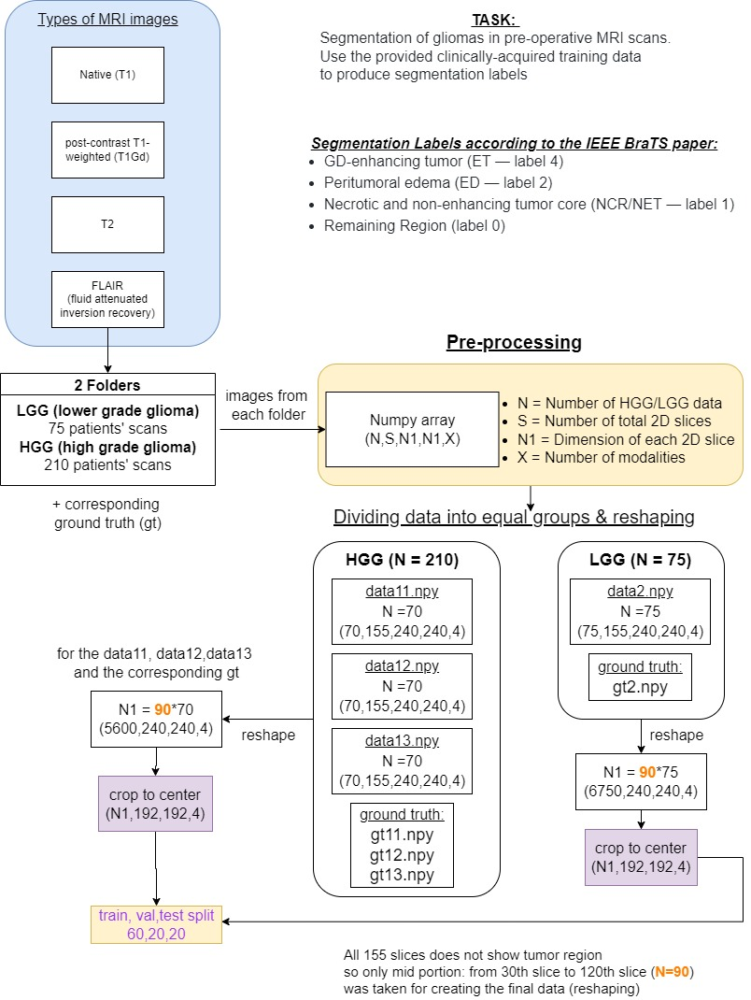

## Loading data from mri scans

In [6]:
path1 = './HGG/'
path2 = './LGG/'

SimpleITK is a segmentation tool (more info [here](https://simpleitk.org/))

In [7]:
!pip install SimpleITK

In [8]:
import SimpleITK as sitk 
from tqdm import tqdm
import numpy as np

In [9]:
def load_data(path):
  my_dir = sorted(os.listdir(path))
  data = []
  gt = []
  for p in tqdm(my_dir):
    data_list = sorted(os.listdir(path+p))
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[0])
    flair = sitk.GetArrayFromImage(img_itk)
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[1])
    seg =  sitk.GetArrayFromImage(img_itk)
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[2])    
    t1 =  sitk.GetArrayFromImage(img_itk)
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[3])
    t1ce =  sitk.GetArrayFromImage(img_itk)
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[4])
    t2 =  sitk.GetArrayFromImage(img_itk)
    data.append([flair,t1,t1ce,t2])
    gt.append(seg)
  data = np.asarray(data,dtype=np.float32)
  gt = np.asarray(gt,dtype=np.uint8)
  return data,gt

From this point on the problems begin :( <br>
I am using Google Colab Premium with access to better GPU and RAM but the data loading for HGG (much higher number of images, crashes dur to excessive usage of RAM). <br>
Loading LGG works (fewer images). 

In [ ]:
# for HGG -- crashes dur to excessive RAM usage ---
#data1,gt1 = load_data(path1)   #dividing HGG in three parts i.e. 210 into three sets of 70 

100%|██████████| 210/210 [11:43<00:00,  3.35s/it]


In [39]:
#for LGG
data2,gt2 = load_data(path2)  #LGG having 75 patients 

100%|██████████| 75/75 [05:53<00:00,  4.71s/it]


In [40]:
#checking the shpe of the data:
data2.shape,gt2.shape,data2.dtype,gt2.dtype

((75, 4, 155, 240, 240), (75, 155, 240, 240), dtype('float32'), dtype('uint8'))

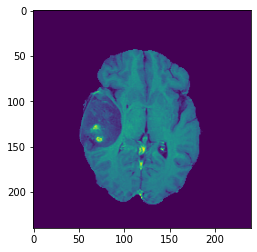

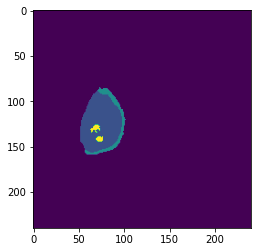

In [41]:
#Looking at the image and the corresponding ground truth
import matplotlib.pyplot as plt
plt.imshow(data2[45,2,65,:,:])
plt.show()
plt.imshow(gt2[45,65,:,:])
plt.show()

In [ ]:
#saving the numpies for later usage (it took a lot of time to get them, I better save it)
np.save('/content/data2.npy',data2)
np.save('/content/gt2.npy',gt2)

## Loading saved data for usage

In [28]:
data = np.load('./Extracted Data/data2.npy')
gt = np.load('./Extracted Data/gt2.npy')

In [29]:
data = np.transpose(data,(0,2,3,4,1))

In [30]:
data.shape,gt.shape,data.dtype,gt.dtype

((75, 155, 240, 240, 4), (75, 155, 240, 240), dtype('int16'), dtype('int16'))

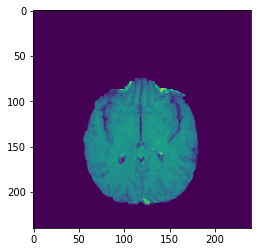

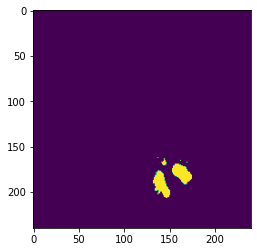

In [45]:
#Looking at the image and the ground truth
import matplotlib.pyplot as plt
plt.imshow(data[50,70,:,:,2])
plt.show()
plt.imshow(gt[50,70,:,:])
plt.show()

# Pre-Processing of data 

In [31]:
data.shape,gt.shape

((75, 155, 240, 240, 4), (75, 155, 240, 240))

**Hypothesis:** The tumor should be in the middle of the slices. We can take only from 30th slice till 120th slice (90 slices (see also the digramme above)) for creating the data and also cropping the images to discard useless background .
So, from 240x240x4 each image now becomes of shape 192x192x4 taking all 4 modalities

In [32]:
data = data[:,30:120,30:222,30:222,:].reshape([-1,192,192,4])
gt = gt[:,30:120,30:222,30:222].reshape([-1,192,192,1])

In [33]:
data.shape,gt.shape

((6750, 192, 192, 4), (6750, 192, 192, 1))

In [34]:
#converting ground truth value of 4 to 3 to do one hot encoding 
#Consider value 3 in results in output as class 4
gt[np.where(gt==4)]=3   

In [35]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(data, gt, test_size=0.20, random_state=42)
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.25,random_state=42)

Here the RAM crashes again :(

In [ ]:
## to.categorical() crashes due to insufficient RAM 
from tensorflow.keras.utils import to_categorical,normalize
Y_train = to_categorical(Y_train)
Y_val = to_categorical(Y_val)
X_train = (X_train-np.mean(X_train))/np.max(X_train)
X_test = (X_test-np.mean(X_test))/np.max(X_test)
X_val = (X_val-np.mean(X_val))/np.max(X_val)

the few cells below (7 cells) are to compensate the fact that the above cell cannot execute: <br>
(Basically this data was saved on the google drive of the BrATS so I'm just loading from there)

In [10]:
Y_train = np.load('/content/drive/MyDrive/Dataset/Training Data/Y_train4.npy')

In [11]:
Y_val = np.load('/content/drive/MyDrive/Dataset/Validation Data/Y_val4.npy')

In [12]:
X_train = np.load('/content/drive/MyDrive/Dataset/Training Data/X_train4.npy')

In [13]:
X_test = np.load('/content/drive/MyDrive/Dataset/Test Data/X_test4.npy')

In [14]:
X_val = np.load('/content/drive/MyDrive/Dataset/Validation Data/X_val4.npy')

In [18]:
Y_test = np.load('/content/drive/MyDrive/Dataset/Test Data/Y_test4.npy')

In [16]:
X_train = (X_train-np.mean(X_train))/np.max(X_train)
X_test = (X_test-np.mean(X_test))/np.max(X_test)
X_val = (X_val-np.mean(X_val))/np.max(X_val)

In [19]:
X_train.shape,Y_train.shape, X_val.shape, Y_val.shape, X_test.shape, Y_test.shape

((4050, 192, 192, 4),
 (4050, 192, 192, 4),
 (1350, 192, 192, 4),
 (1350, 192, 192, 4),
 (1350, 192, 192, 4),
 (1350, 192, 192, 1))

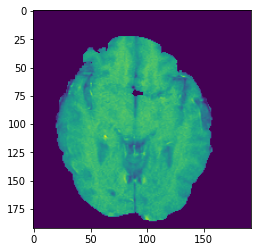

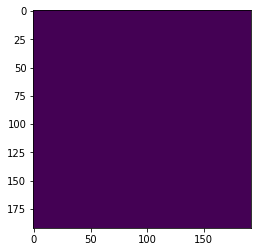

In [22]:
plt.imshow(X_train[1,:,:,1])
plt.show()
plt.imshow(Y_train[1,:,:,3])
plt.show()

# U-net + dice loss 

## Loading Data

Using 4 sets made by pre-processing one by one each having training set of 3780, validaiton of 1260 and test data of 1260 slices of mri scans

In [23]:
X_train.shape,Y_train.shape,X_val.shape,Y_val.shape

((4050, 192, 192, 4),
 (4050, 192, 192, 4),
 (1350, 192, 192, 4),
 (1350, 192, 192, 4))

In [24]:
 %tensorflow_version 1.x
from keras.models import Model
from keras.layers import MaxPooling2D,Conv2D,Dense,BatchNormalization,concatenate,Input,Dropout,Maximum,Activation,Dense,Flatten,UpSampling2D,Conv2DTranspose
from keras.optimizers import SGD,Adam,RMSprop
import keras.callbacks as callbacks
import keras.initializers as initializers
from keras.callbacks import Callback
from keras import regularizers

TensorFlow 1.x selected.


Using TensorFlow backend.


In [25]:
############################################ U-net #############################################

############ Encoder #############
input_ = Input(shape=(192,192,4),name='input')                                              

block1_conv1 = Conv2D(64,3,padding='same',activation='relu',name='block1_conv1')(input_)
block1_conv2 = Conv2D(64,3,padding='same',activation='relu',name='block1_conv2')(block1_conv1)
block1_norm = BatchNormalization(name='block1_batch_norm')(block1_conv2)
block1_pool = MaxPooling2D(name='block1_pool')(block1_norm)

block2_conv1 = Conv2D(128,3,padding='same',activation='relu',name='block2_conv1')(block1_pool)
block2_conv2 = Conv2D(128,3,padding='same',activation='relu',name='block2_conv2')(block2_conv1)
block2_norm = BatchNormalization(name='block2_batch_norm')(block2_conv2)
block2_pool = MaxPooling2D(name='block2_pool')(block2_norm)

encoder_dropout_1 = Dropout(0.2,name='encoder_dropout_1')(block2_pool)

block3_conv1 = Conv2D(256,3,padding='same',activation='relu',name='block3_conv1')(encoder_dropout_1)
block3_conv2 = Conv2D(256,3,padding='same',activation='relu',name='block3_conv2')(block3_conv1)
block3_norm = BatchNormalization(name='block3_batch_norm')(block3_conv2)
block3_pool = MaxPooling2D(name='block3_pool')(block3_norm)

block4_conv1 = Conv2D(512,3,padding='same',activation='relu',name='block4_conv1')(block3_pool)
block4_conv2 = Conv2D(512,3,padding='same',activation='relu',name='block4_conv2')(block4_conv1)
block4_norm = BatchNormalization(name='block4_batch_norm')(block4_conv2)
block4_pool = MaxPooling2D(name='block4_pool')(block4_norm)
################### Encoder end ######################

block5_conv1 = Conv2D(1024,3,padding='same',activation='relu',name='block5_conv1')(block4_pool)
# encoder_dropout_2 = Dropout(0.2,name='encoder_dropout_2')(block5_conv1)

########### Decoder ################

up_pool1 = Conv2DTranspose(1024,3,strides = (2, 2),padding='same',activation='relu',name='up_pool1')(block5_conv1)
merged_block1 = concatenate([block4_norm,up_pool1],name='merged_block1')
decod_block1_conv1 = Conv2D(512,3, padding = 'same', activation='relu',name='decod_block1_conv1')(merged_block1)

up_pool2 = Conv2DTranspose(512,3,strides = (2, 2),padding='same',activation='relu',name='up_pool2')(decod_block1_conv1)
merged_block2 = concatenate([block3_norm,up_pool2],name='merged_block2')
decod_block2_conv1 = Conv2D(256,3,padding = 'same',activation='relu',name='decod_block2_conv1')(merged_block2)

decoder_dropout_1 = Dropout(0.2,name='decoder_dropout_1')(decod_block2_conv1)

up_pool3 = Conv2DTranspose(256,3,strides = (2, 2),padding='same',activation='relu',name='up_pool3')(decoder_dropout_1)
merged_block3 = concatenate([block2_norm,up_pool3],name='merged_block3')
decod_block3_conv1 = Conv2D(128,3,padding = 'same',activation='relu',name='decod_block3_conv1')(merged_block3)

up_pool4 = Conv2DTranspose(128,3,strides = (2, 2),padding='same',activation='relu',name='up_pool4')(decod_block3_conv1)
merged_block4 = concatenate([block1_norm,up_pool4],name='merged_block4')
decod_block4_conv1 = Conv2D(64,3,padding = 'same',activation='relu',name='decod_block4_conv1')(merged_block4)
############ Decoder End ######################################

# decoder_dropout_2 = Dropout(0.2,name='decoder_dropout_2')(decod_block4_conv1)

pre_output = Conv2D(64,1,padding = 'same',activation='relu',name='pre_output')(decod_block4_conv1)

output = Conv2D(4,1,padding='same',activation='softmax',name='output')(pre_output)

model = Model(inputs = input_, outputs = output)
model.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              (None, 192, 192, 4)  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 192, 192, 64) 2368        input[0][0]                      
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 192, 192, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_batch_norm (BatchNormali (None, 192, 192, 64) 256         block1_conv2[0][0]               
__________

In [27]:
os.chdir('/content/')

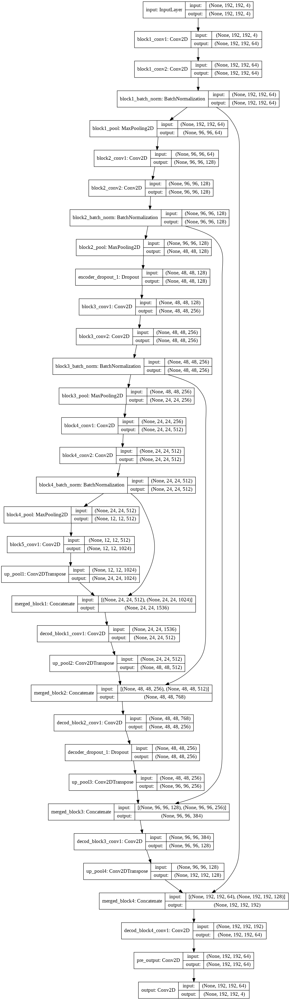

In [28]:
from keras.utils import  plot_model
plot_model(model, to_file = 'unetshape.png', show_shapes=True)

In [ ]:
#  clr = CyclicLR(base_lr=1e-5, max_lr=1e-4,step_size=4, mode='triangular')

##Working Area

In [29]:
from keras import backend as K
def dice_coef(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    return (2. * intersection) / (K.sum(K.square(y_true),axis=-1) + K.sum(K.square(y_pred),axis=-1) + epsilon)

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

In [34]:
from google.colab import files
weights = files.upload()

In [35]:
model.compile(optimizer=Adam(lr=1e-5),loss=dice_coef_loss,metrics=[dice_coef])
#checkpointer = callbacks.ModelCheckpoint(filepath = './Model Checkpoints/weights.hdf5',save_best_only=True)
#training_log = callbacks.TensorBoard(log_dir='./Model_logs')

In [37]:
history = model.fit(X_train,Y_train,validation_data=(X_val,Y_val),batch_size=32,epochs=16,shuffle=True)

Train on 4050 samples, validate on 1350 samples
Epoch 1/16
4050/4050 [==============================] - 91s 22ms/step - loss: 0.0327 - dice_coef: 0.9673 - val_loss: 0.0317 - val_dice_coef: 0.9683
Epoch 2/16
4050/4050 [==============================] - 91s 23ms/step - loss: 0.0324 - dice_coef: 0.9676 - val_loss: 0.0316 - val_dice_coef: 0.9684
Epoch 3/16
4050/4050 [==============================] - 91s 22ms/step - loss: 0.0280 - dice_coef: 0.9720 - val_loss: 0.0320 - val_dice_coef: 0.9680
Epoch 4/16
4050/4050 [==============================] - 91s 23ms/step - loss: 0.0202 - dice_coef: 0.9798 - val_loss: 0.0268 - val_dice_coef: 0.9732
Epoch 5/16
4050/4050 [==============================] - 91s 22ms/step - loss: 0.0176 - dice_coef: 0.9824 - val_loss: 0.0342 - val_dice_coef: 0.9658
Epoch 6/16
4050/4050 [==============================] - 91s 23ms/step - loss: 0.0159 - dice_coef: 0.9841 - val_loss: 0.0274 - val_dice_coef: 0.9726
Epoch 7/16
4050/4050 [==============================] - 91s 22ms

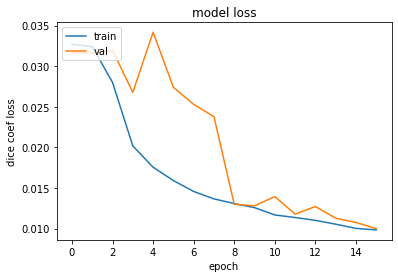

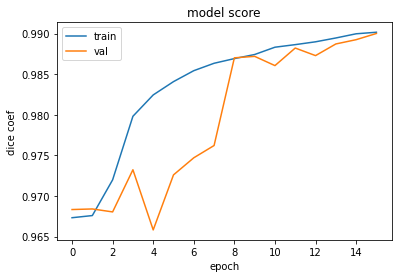

In [38]:
# summarize history for loss
import matplotlib.pyplot as plt
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('dice coef loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
plt.plot(history.history['dice_coef'])
plt.plot(history.history['val_dice_coef'])
plt.title('model score')
plt.ylabel('dice coef')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [39]:
Y_pre = np.argmax(model.predict(X_test),axis=-1)

In [40]:
np.unique(Y_pre)

array([0, 1, 2])

In [41]:
Y_pre.shape

(1350, 192, 192)

In [42]:
Y_pre=Y_pre.reshape(-1,192,192,1)

In [43]:
Y_test.shape,X_test.shape

((1350, 192, 192, 1), (1350, 192, 192, 4))

X_test 450


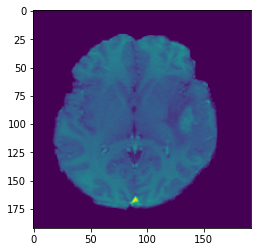

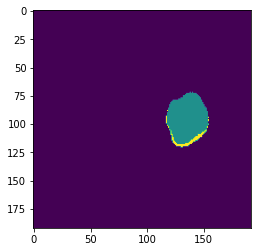

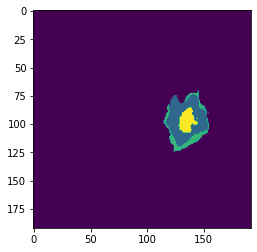

X_test 451


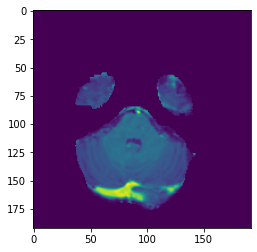

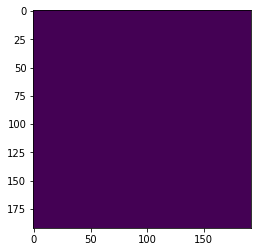

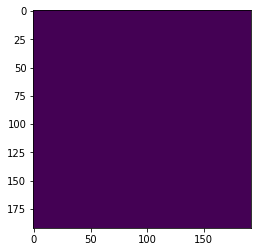

X_test 452


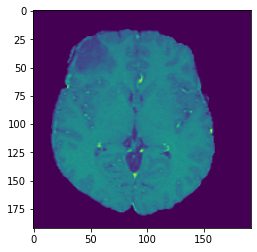

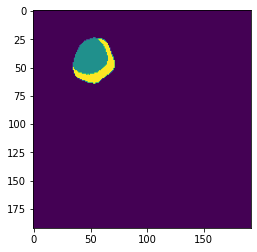

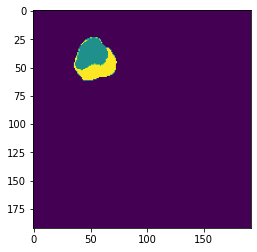

X_test 453


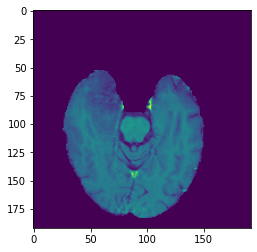

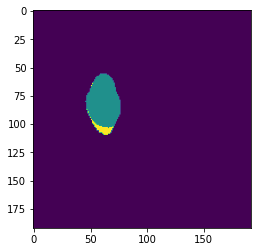

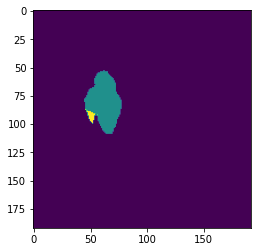

X_test 454


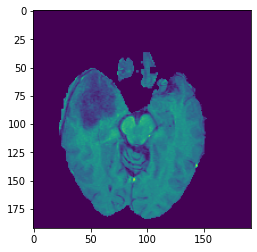

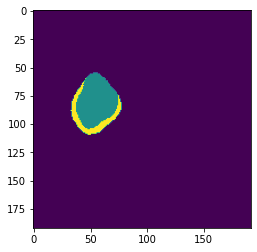

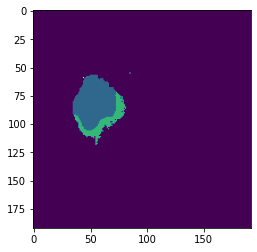

X_test 455


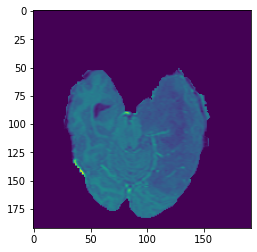

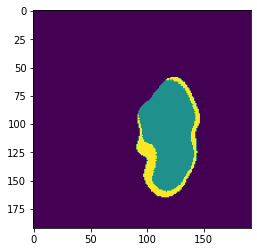

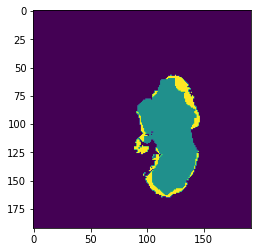

X_test 456


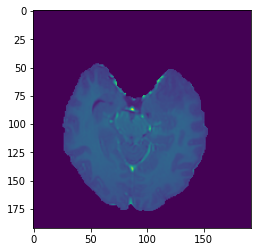

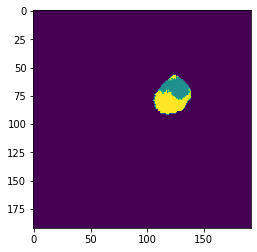

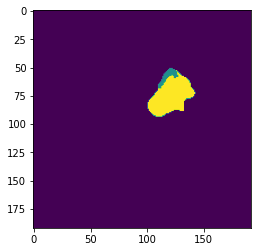

X_test 457


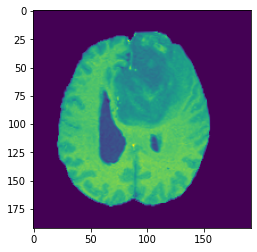

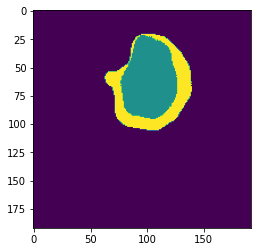

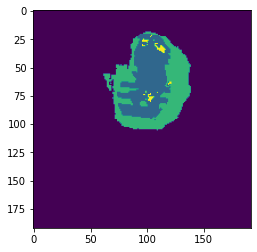

X_test 458


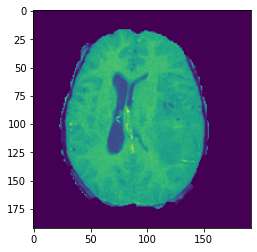

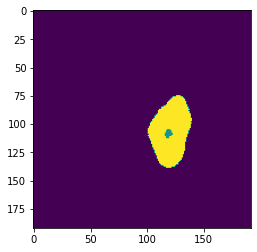

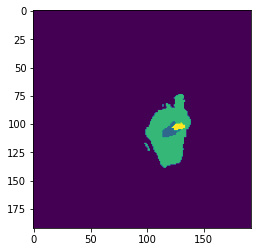

X_test 459


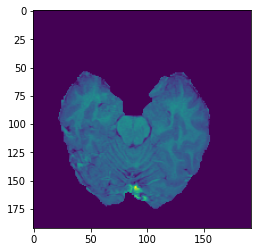

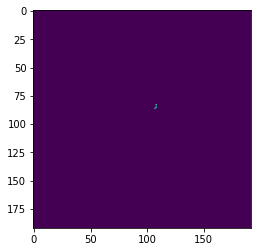

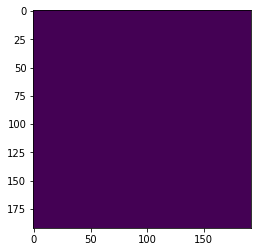

X_test 460


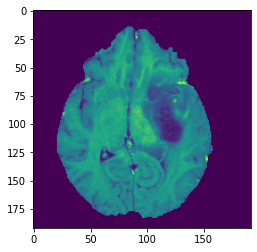

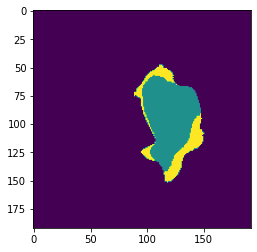

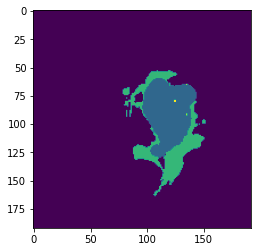

X_test 461


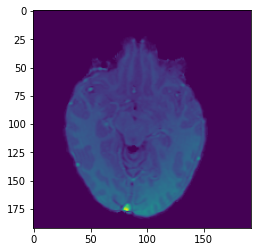

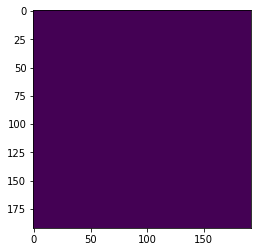

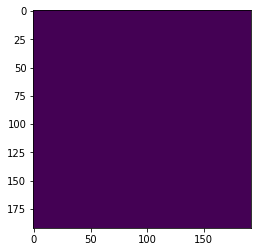

X_test 462


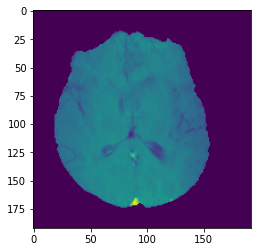

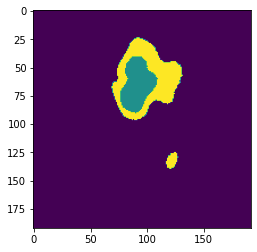

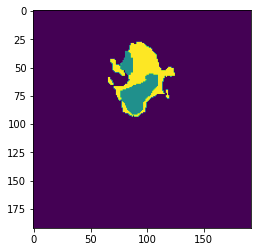

X_test 463


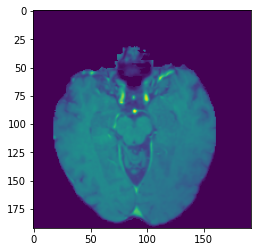

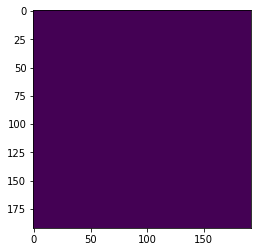

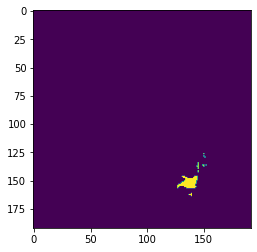

X_test 464


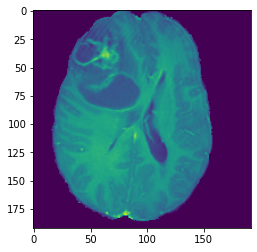

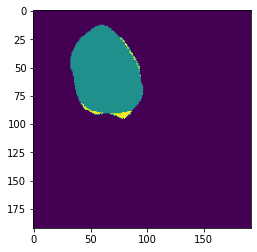

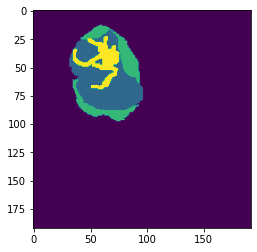

X_test 465


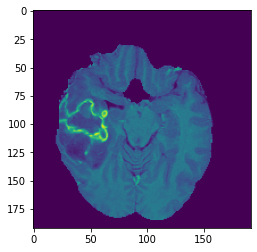

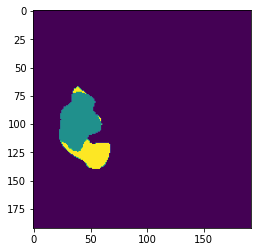

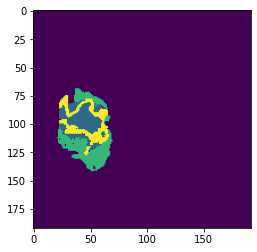

X_test 466


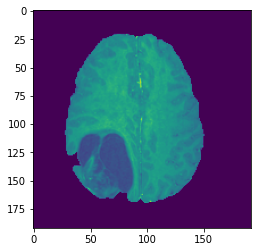

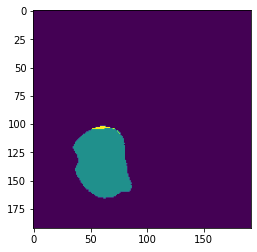

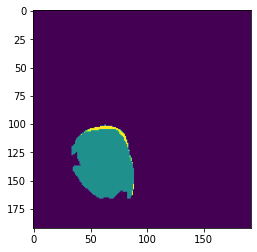

X_test 467


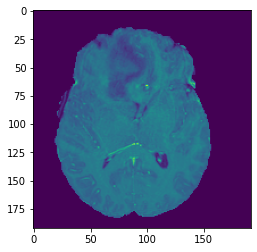

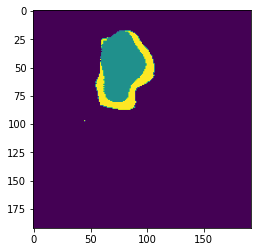

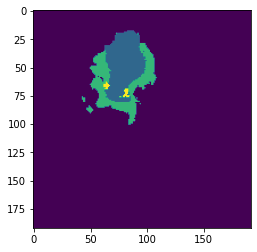

X_test 468


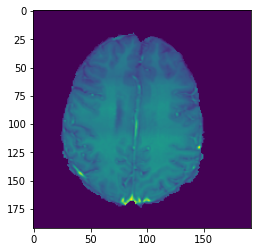

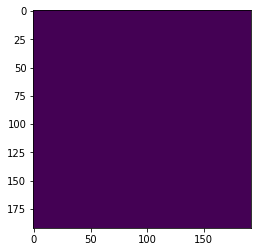

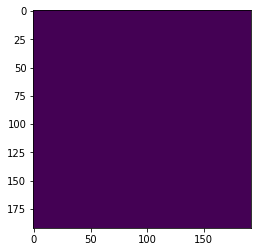

X_test 469


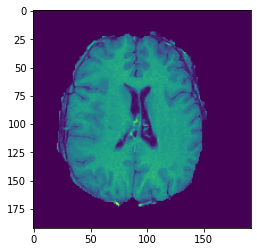

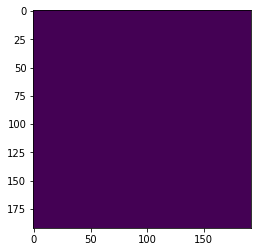

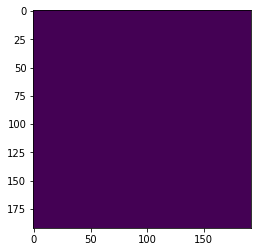

X_test 470


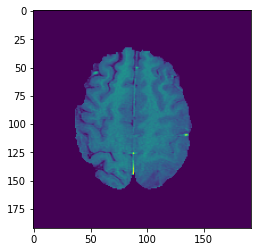

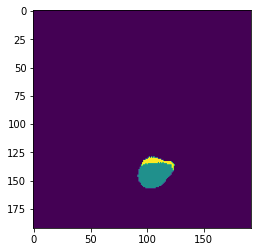

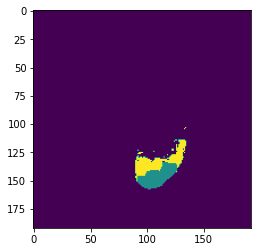

X_test 471


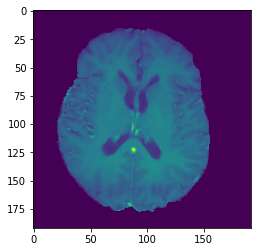

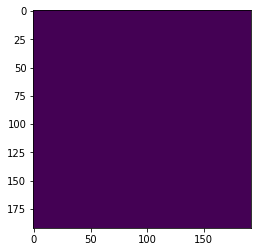

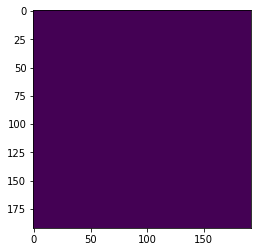

X_test 472


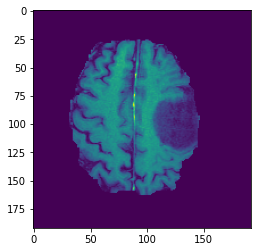

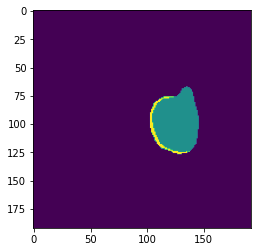

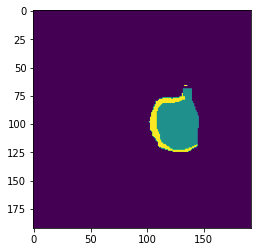

X_test 473


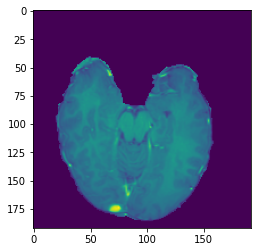

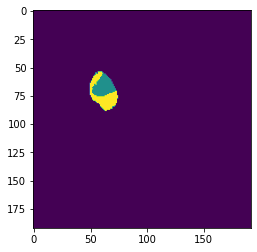

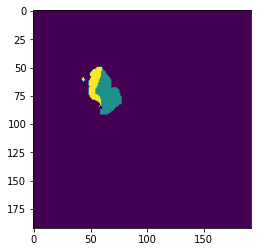

X_test 474


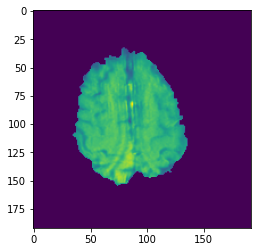

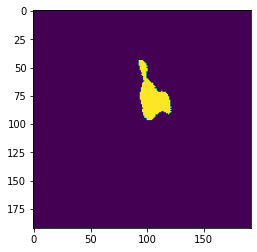

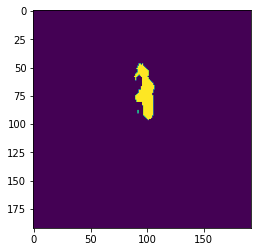

X_test 475


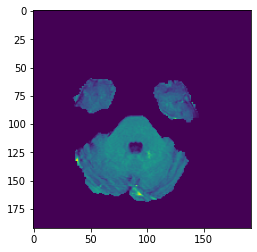

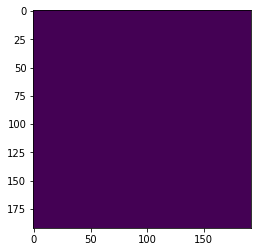

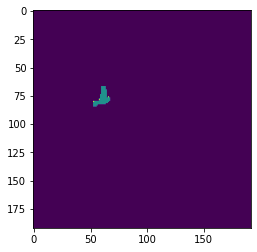

X_test 476


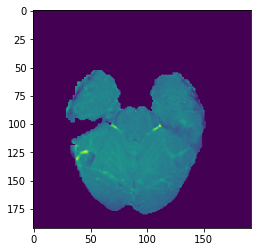

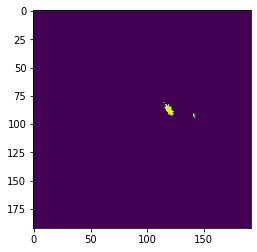

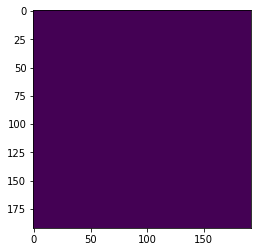

X_test 477


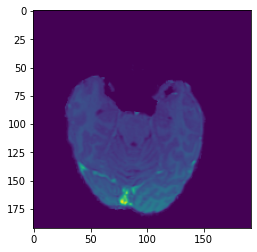

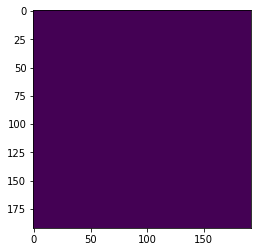

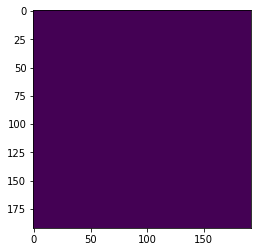

X_test 478


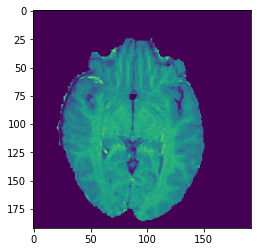

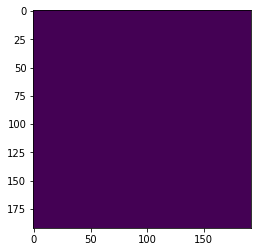

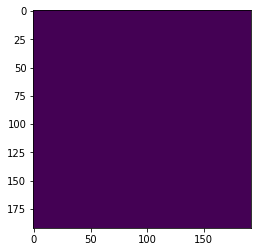

X_test 479


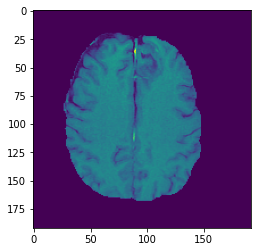

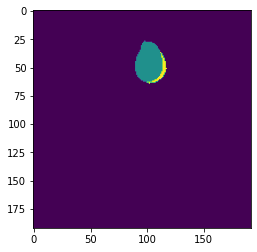

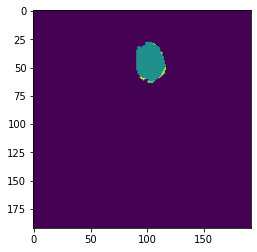

X_test 480


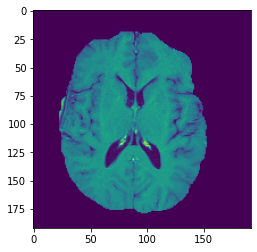

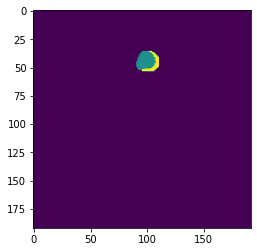

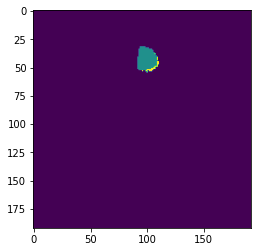

X_test 481


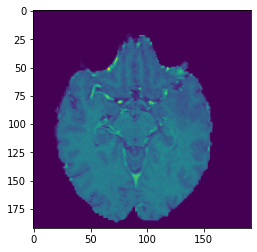

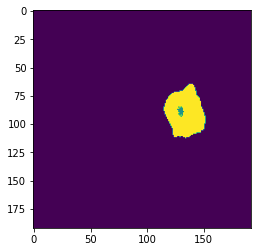

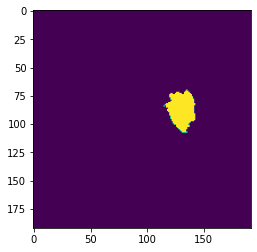

X_test 482


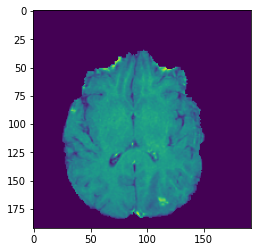

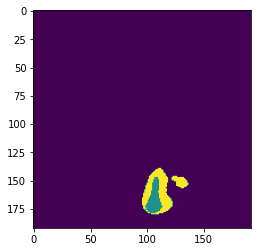

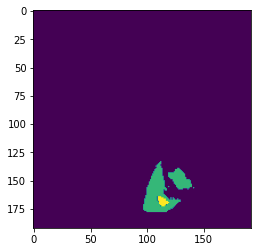

X_test 483


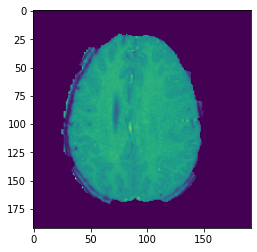

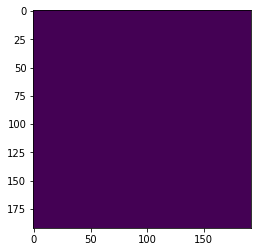

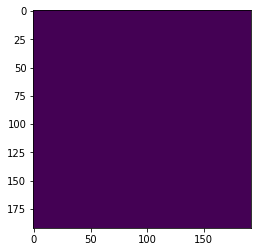

X_test 484


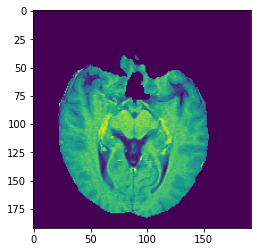

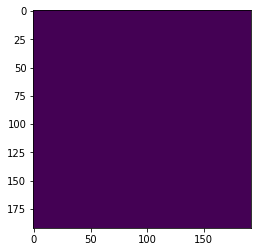

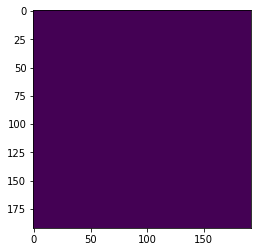

X_test 485


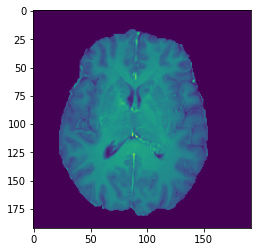

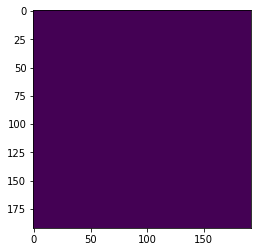

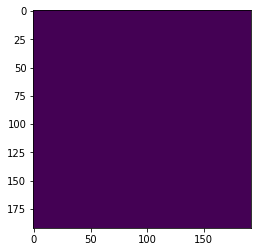

X_test 486


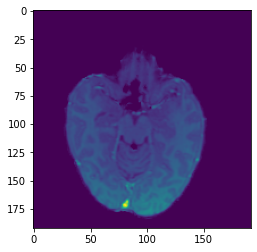

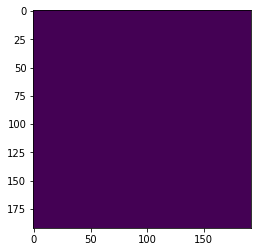

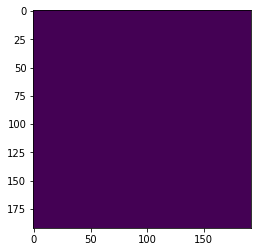

X_test 487


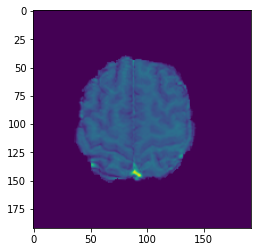

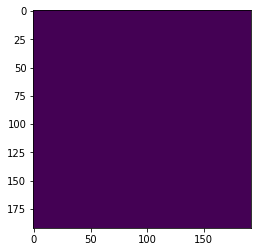

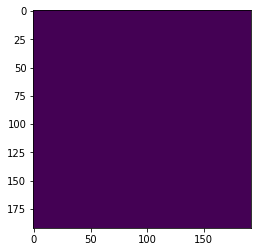

X_test 488


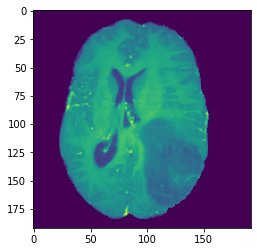

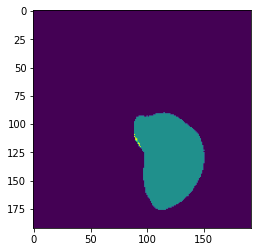

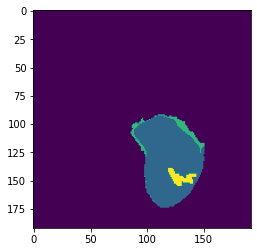

X_test 489


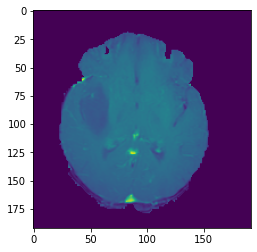

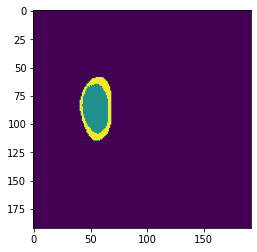

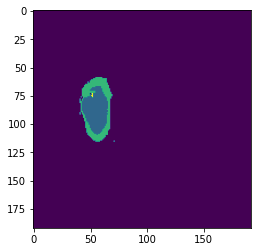

X_test 490


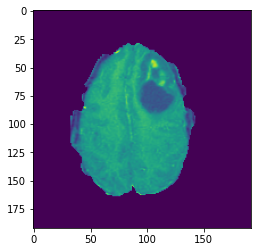

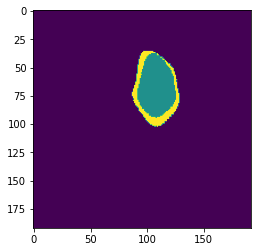

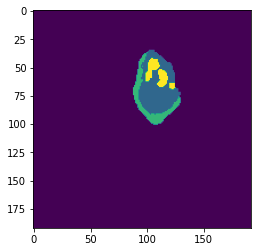

X_test 491


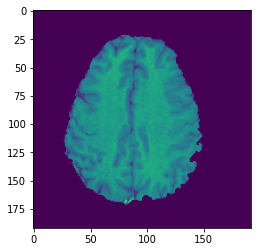

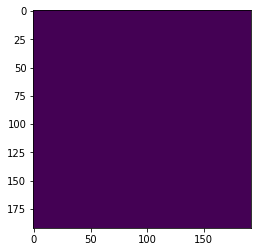

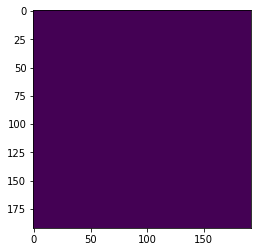

X_test 492


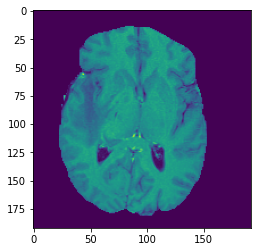

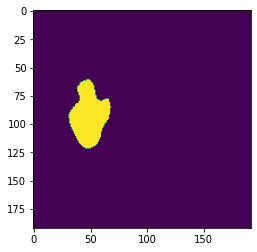

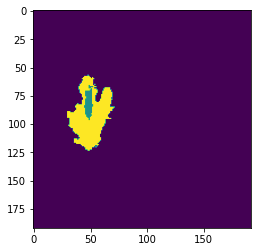

X_test 493


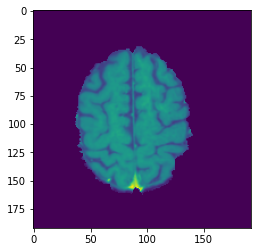

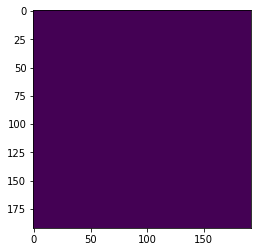

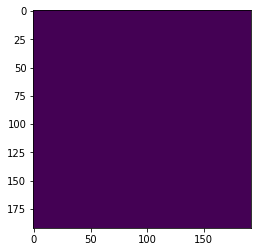

X_test 494


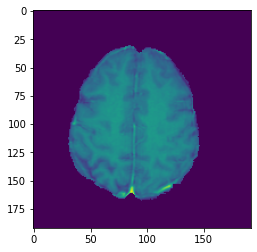

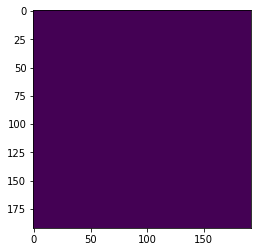

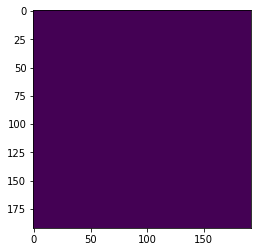

X_test 495


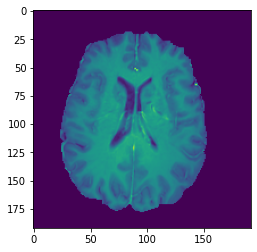

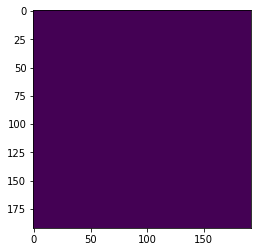

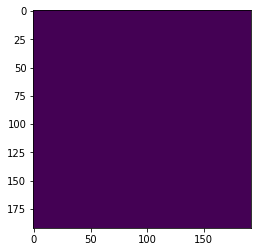

X_test 496


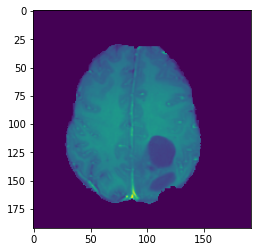

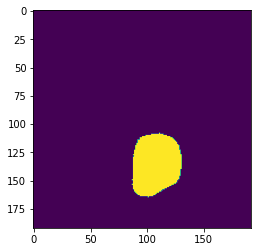

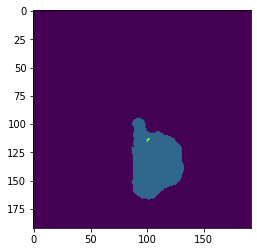

X_test 497


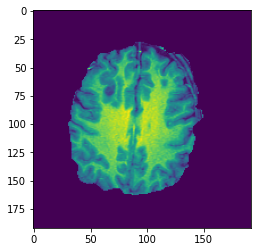

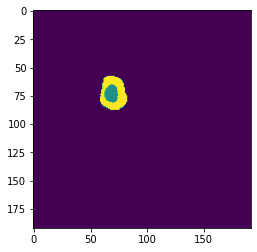

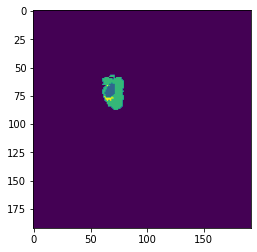

X_test 498


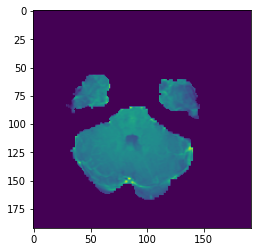

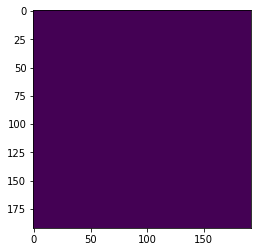

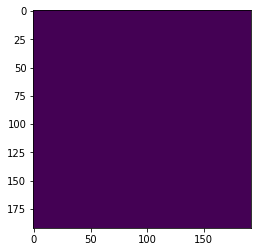

X_test 499


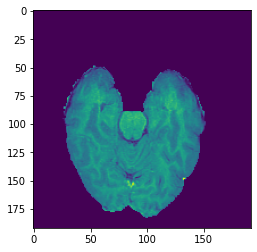

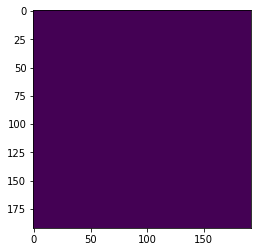

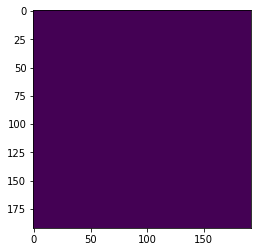

In [44]:
for i in range(450,500):
  print('X_test '+ str(i))
  plt.imshow(X_test[i,:,:,2])
  plt.show()
  plt.imshow(Y_pre[i,:,:,0])
  plt.show()
  plt.imshow(Y_test[i,:,:,0])
  plt.show()

In [45]:
from keras.utils import to_categorical
Y_test_encod = to_categorical(Y_test)

In [46]:
model.evaluate(X_test,Y_test_encod,verbose=0)

[0.009842834042178259, 0.9901574850082397]

In [47]:
!pwd

/content


In [48]:
model.save('/content/model.h5',overwrite=True)

In [49]:
os.chdir('/content/drive/MyDrive/Dataset')

#Evaluation of the Model

In [50]:
import numpy as np
X_test1 = np.load('./Test Data/X_test1.npy')
X_test2 = np.load('./Test Data/X_test2.npy')
X_test3 = np.load('./Test Data/X_test3.npy')
X_test4 = np.load('./Test Data/X_test4.npy')

Y_test1 = np.load('./Test Data/Y_test1.npy')
Y_test2 = np.load('./Test Data/Y_test2.npy')
Y_test3 = np.load('./Test Data/Y_test3.npy')
Y_test4 = np.load('./Test Data/Y_test4.npy')

In [51]:
from keras.utils import to_categorical
Y_test_encod1 = to_categorical(Y_test1)
Y_test_encod2 = to_categorical(Y_test2)
Y_test_encod3 = to_categorical(Y_test3)
Y_test_encod4 = to_categorical(Y_test4)

In [52]:
model.compile(optimizer=Adam(lr=1e-5),loss=[dice_coef_loss],metrics=[dice_coef])

In [53]:
model.load_weights('./Model Checkpoints/weights.hdf5')

In [54]:
print('HGG Test set no: 1 with Dice Coefficient:- %.4f'%float(list(model.evaluate(X_test1,Y_test_encod1,batch_size=32,verbose=2))[1]))
print('HGG Test set no: 2 with Dice Coefficient:- %.4f'%float(list(model.evaluate(X_test2,Y_test_encod2,batch_size=32,verbose=2))[1]))
print('HGG Test set no: 3 with Dice Coefficient:- %.4f'%float(list(model.evaluate(X_test3,Y_test_encod3,batch_size=32,verbose=2))[1]))
print('LGG Test set no: 4 with Dice Coefficient:- %.4f'%float(list(model.evaluate(X_test4,Y_test_encod4,batch_size=32,verbose=2))[1]))

HGG Test set no: 1 with Dice Coefficient:- 0.9795
HGG Test set no: 2 with Dice Coefficient:- 0.9855
HGG Test set no: 3 with Dice Coefficient:- 0.9793
LGG Test set no: 4 with Dice Coefficient:- 0.9950


Here it chased again T_T
(fml)

In [ ]:
Y_pred1 = np.argmax(model.predict(X_test1),axis=-1).reshape(-1,192,192,1)
Y_pred2 = np.argmax(model.predict(X_test2),axis=-1).reshape(-1,192,192,1)
Y_pred3 = np.argmax(model.predict(X_test3),axis=-1).reshape(-1,192,192,1)
Y_pred4 = np.argmax(model.predict(X_test4),axis=-1).reshape(-1,192,192,1)

HGG test set no: 1 slice no: 450


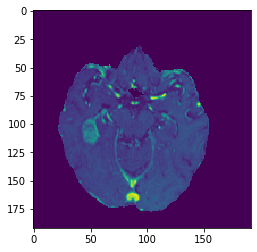

Predicted:- 


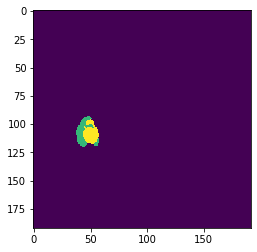

Actual:- 


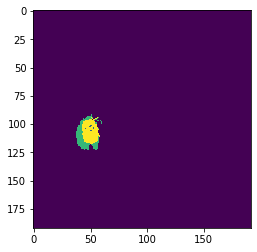

HGG test set no: 1 slice no: 451


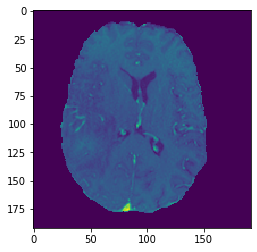

Predicted:- 


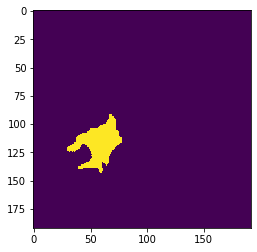

Actual:- 


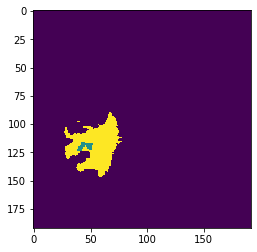

HGG test set no: 1 slice no: 452


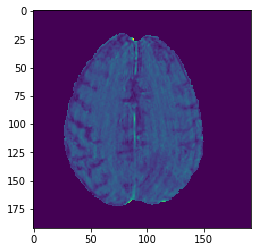

Predicted:- 


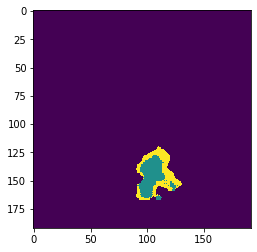

Actual:- 


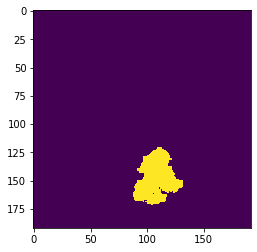

HGG test set no: 1 slice no: 453


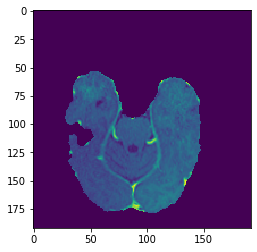

Predicted:- 


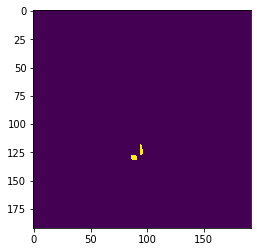

Actual:- 


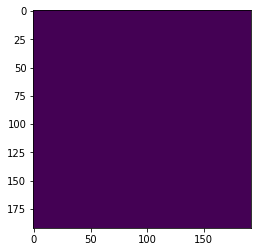

HGG test set no: 1 slice no: 454


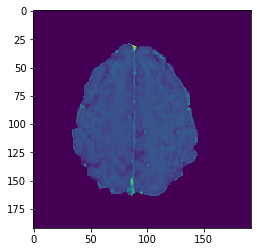

Predicted:- 


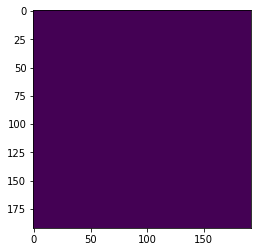

Actual:- 


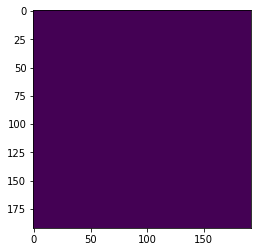

HGG test set no: 1 slice no: 455


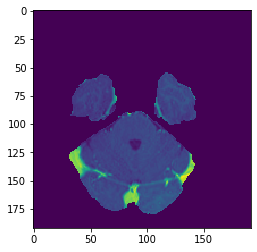

Predicted:- 


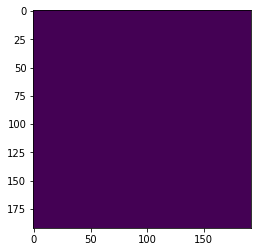

Actual:- 


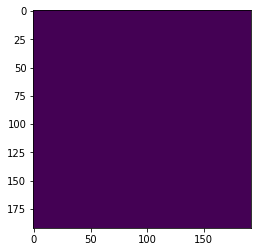

HGG test set no: 1 slice no: 456


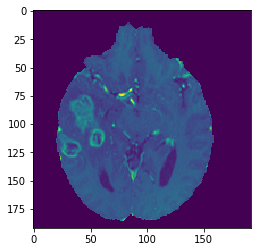

Predicted:- 


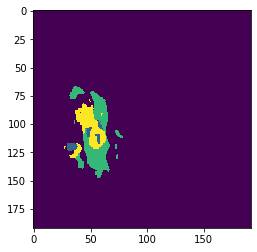

Actual:- 


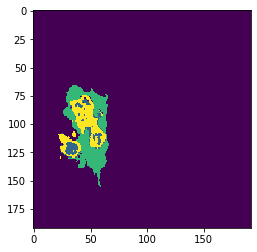

HGG test set no: 1 slice no: 457


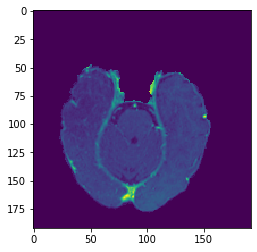

Predicted:- 


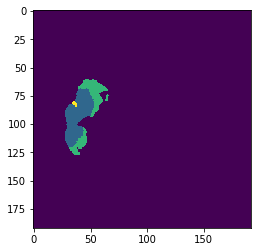

Actual:- 


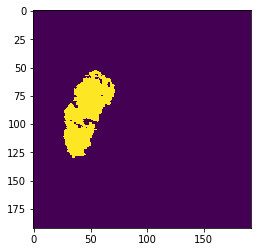

HGG test set no: 1 slice no: 458


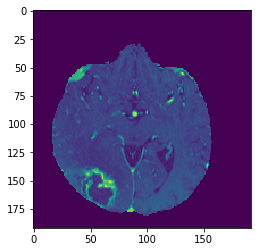

Predicted:- 


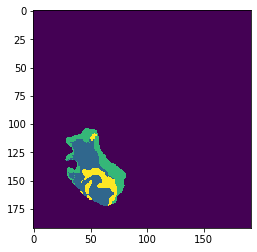

Actual:- 


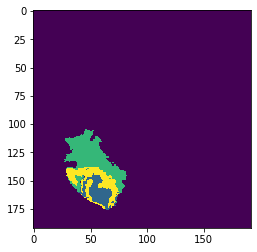

HGG test set no: 1 slice no: 459


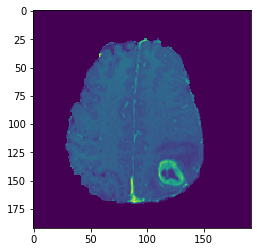

Predicted:- 


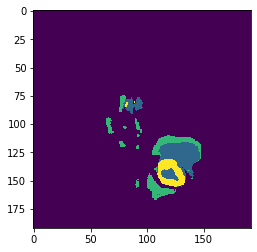

Actual:- 


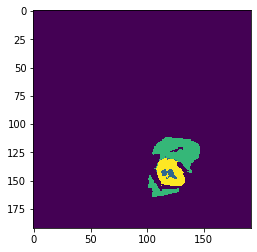

HGG test set no: 1 slice no: 460


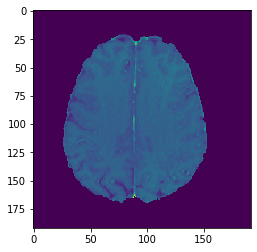

Predicted:- 


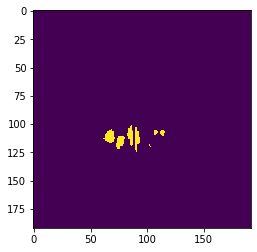

Actual:- 


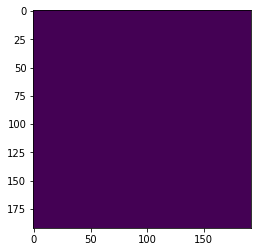

HGG test set no: 1 slice no: 461


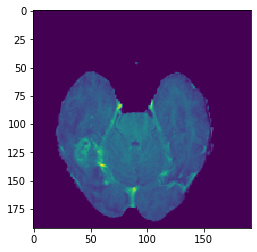

Predicted:- 


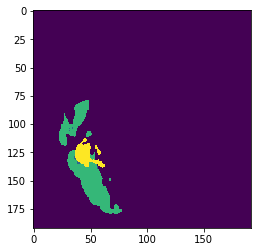

Actual:- 


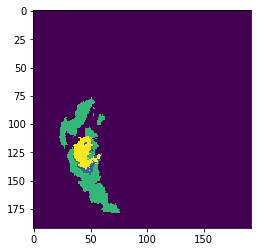

HGG test set no: 1 slice no: 462


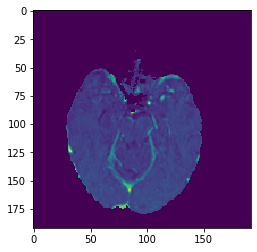

Predicted:- 


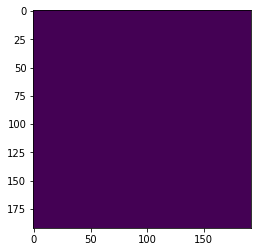

Actual:- 


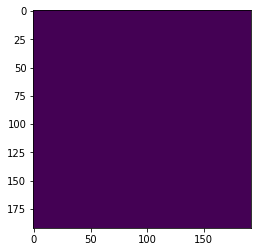

HGG test set no: 1 slice no: 463


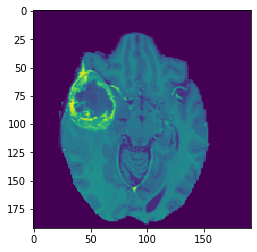

Predicted:- 


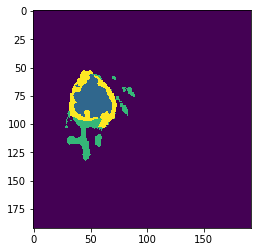

Actual:- 


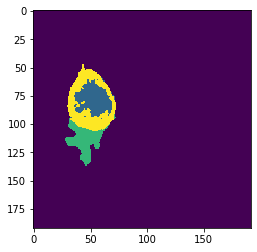

HGG test set no: 1 slice no: 464


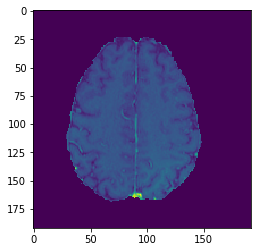

Predicted:- 


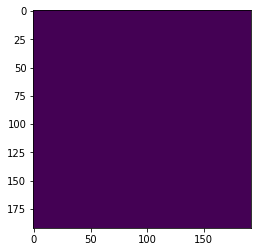

Actual:- 


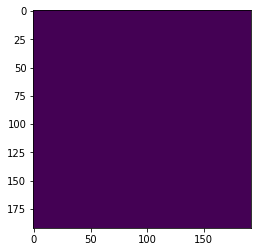

HGG test set no: 1 slice no: 465


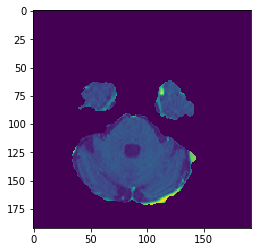

Predicted:- 


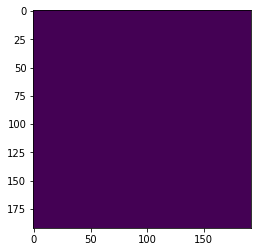

Actual:- 


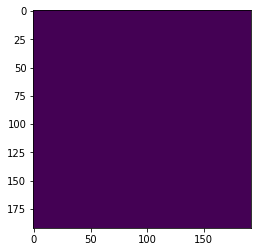

HGG test set no: 1 slice no: 466


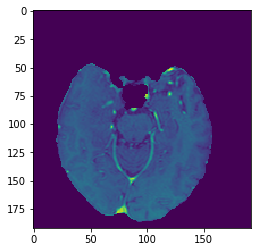

Predicted:- 


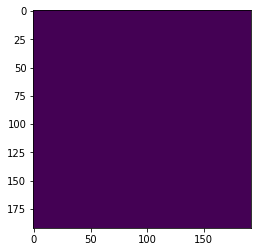

Actual:- 


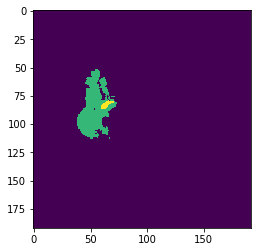

HGG test set no: 1 slice no: 467


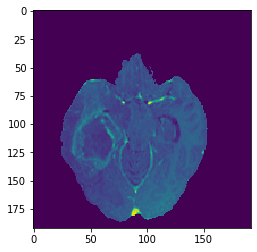

Predicted:- 


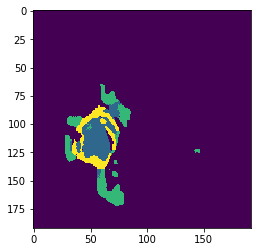

Actual:- 


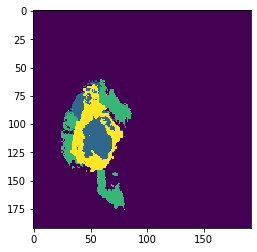

HGG test set no: 1 slice no: 468


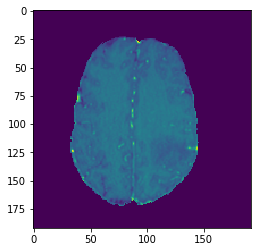

Predicted:- 


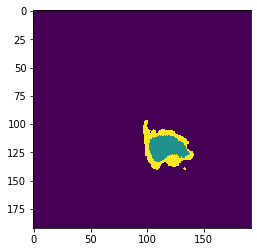

Actual:- 


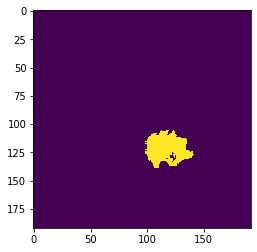

HGG test set no: 1 slice no: 469


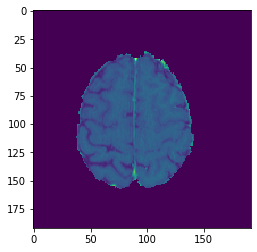

Predicted:- 


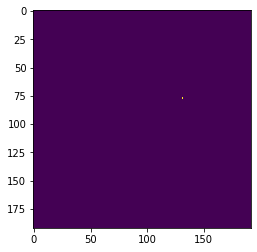

Actual:- 


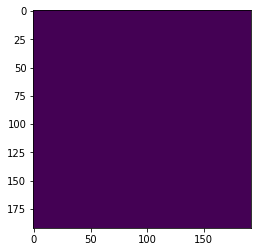

HGG test set no: 1 slice no: 470


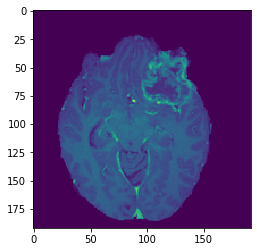

Predicted:- 


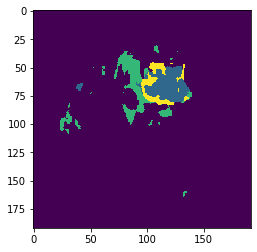

Actual:- 


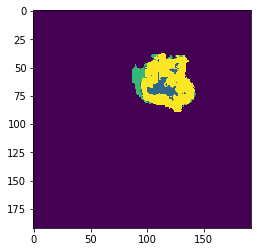

HGG test set no: 1 slice no: 471


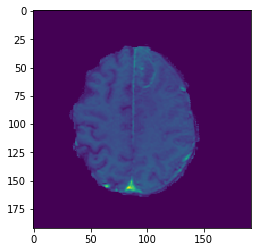

Predicted:- 


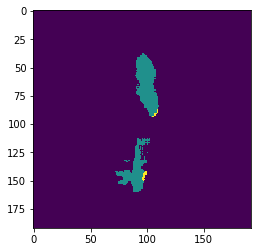

Actual:- 


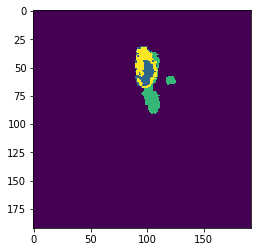

HGG test set no: 1 slice no: 472


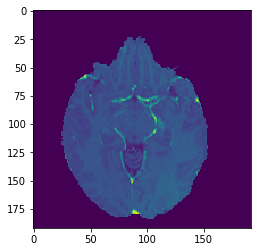

Predicted:- 


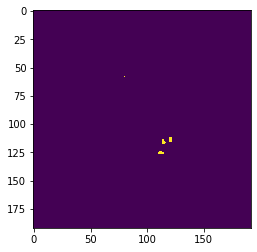

Actual:- 


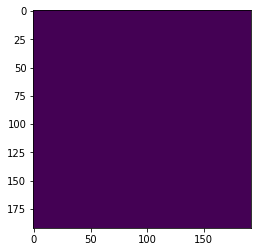

HGG test set no: 1 slice no: 473


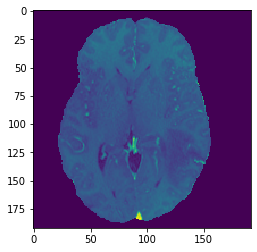

Predicted:- 


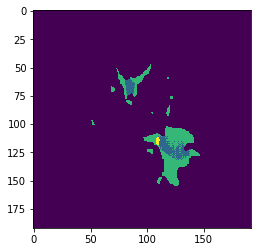

Actual:- 


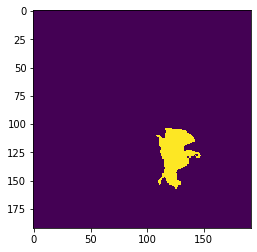

HGG test set no: 1 slice no: 474


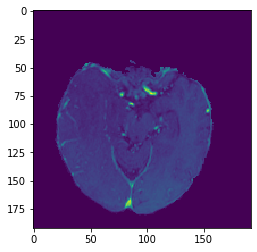

Predicted:- 


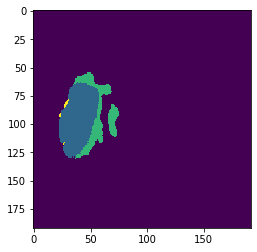

Actual:- 


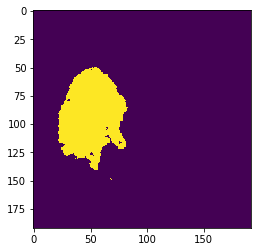

HGG test set no: 1 slice no: 475


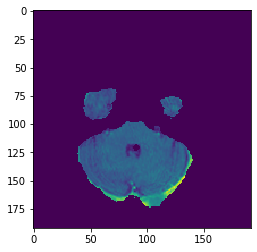

Predicted:- 


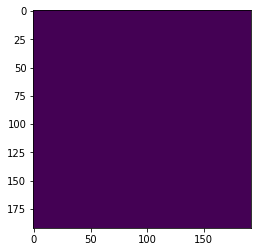

Actual:- 


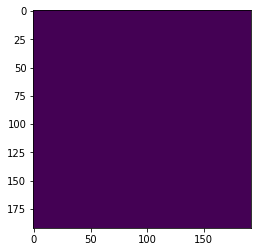

HGG test set no: 1 slice no: 476


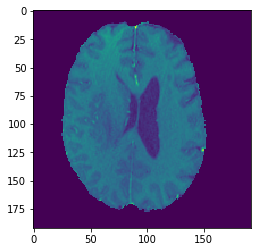

Predicted:- 


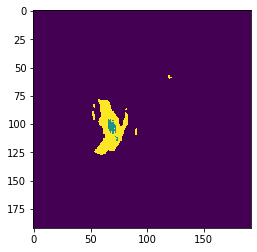

Actual:- 


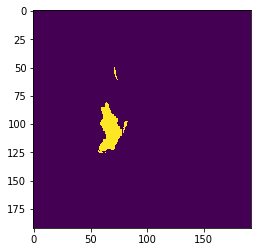

HGG test set no: 1 slice no: 477


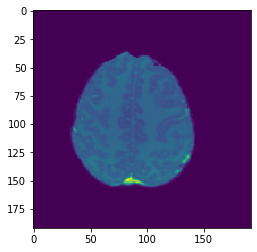

Predicted:- 


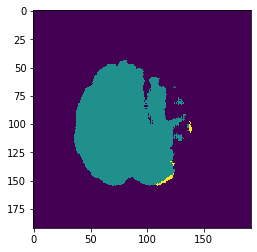

Actual:- 


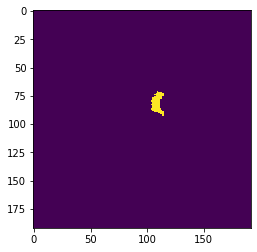

HGG test set no: 1 slice no: 478


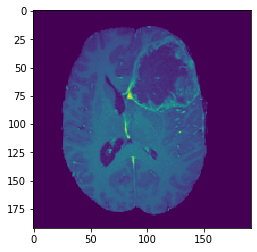

Predicted:- 


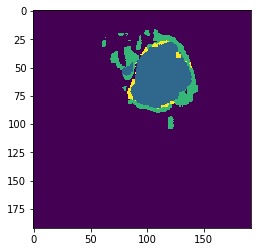

Actual:- 


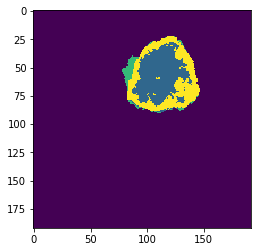

HGG test set no: 1 slice no: 479


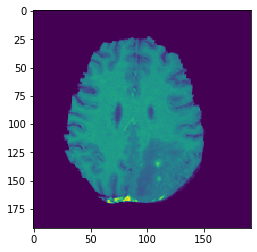

Predicted:- 


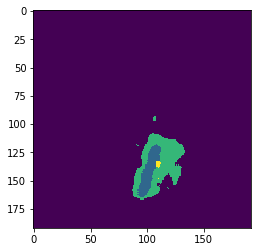

Actual:- 


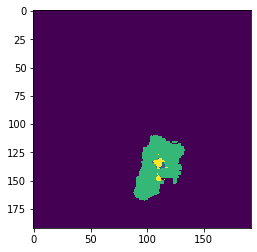

HGG test set no: 1 slice no: 480


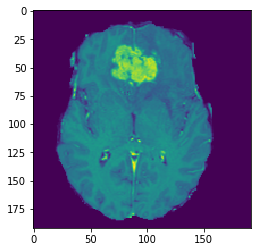

Predicted:- 


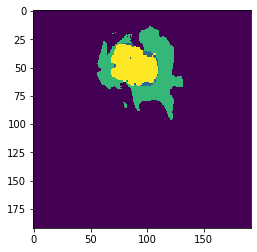

Actual:- 


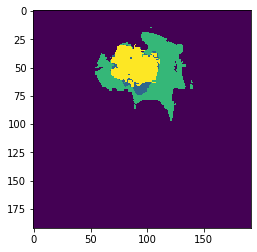

HGG test set no: 1 slice no: 481


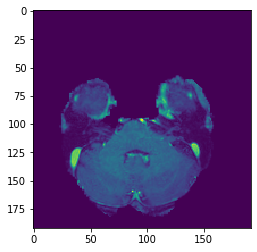

Predicted:- 


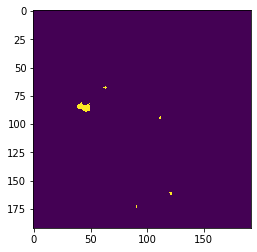

Actual:- 


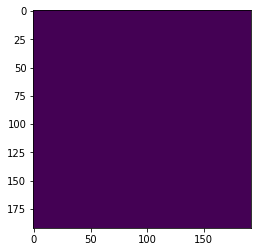

HGG test set no: 1 slice no: 482


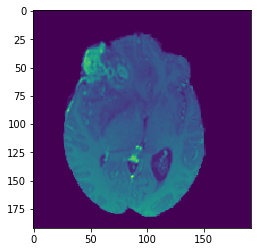

Predicted:- 


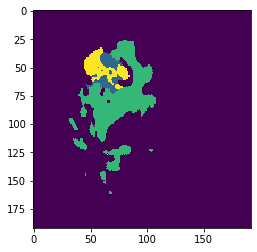

Actual:- 


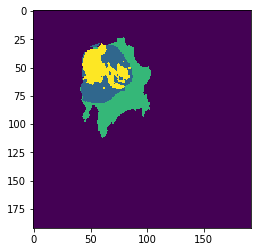

HGG test set no: 1 slice no: 483


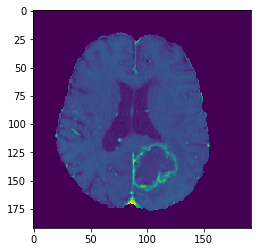

Predicted:- 


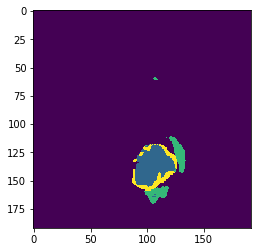

Actual:- 


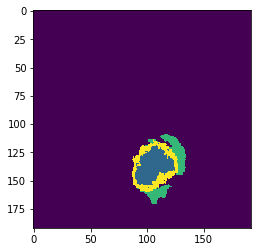

HGG test set no: 1 slice no: 484


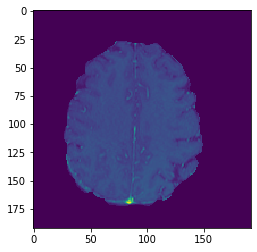

Predicted:- 


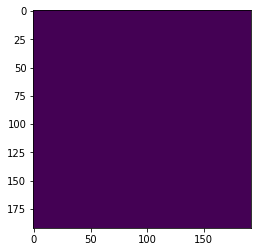

Actual:- 


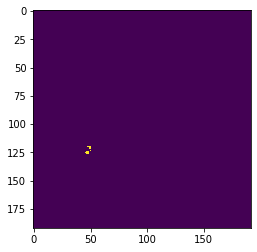

HGG test set no: 1 slice no: 485


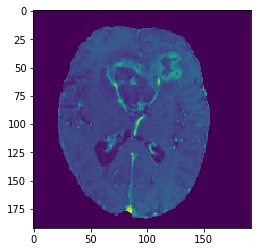

Predicted:- 


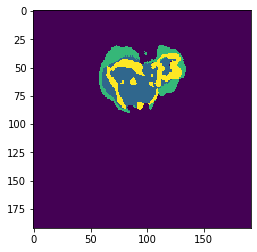

Actual:- 


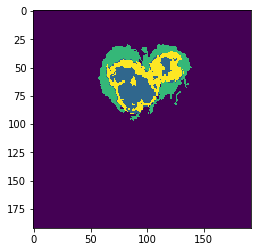

HGG test set no: 1 slice no: 486


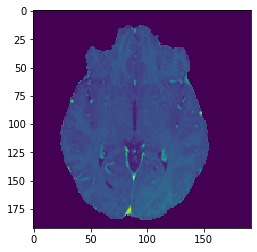

Predicted:- 


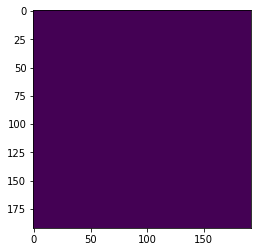

Actual:- 


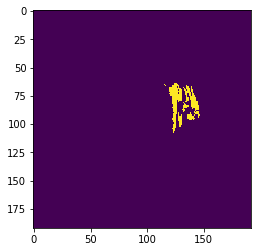

HGG test set no: 1 slice no: 487


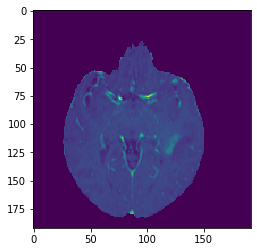

Predicted:- 


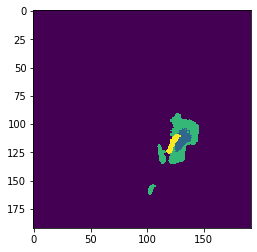

Actual:- 


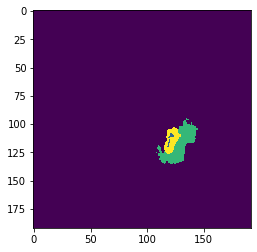

HGG test set no: 1 slice no: 488


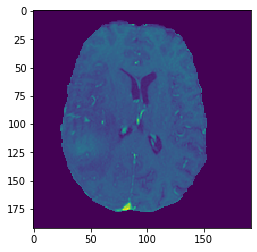

Predicted:- 


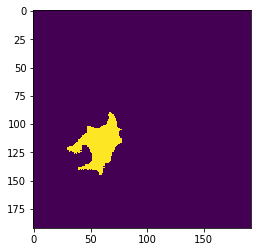

Actual:- 


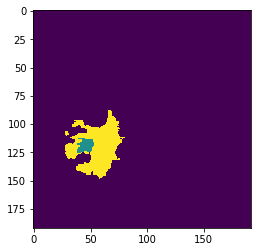

HGG test set no: 1 slice no: 489


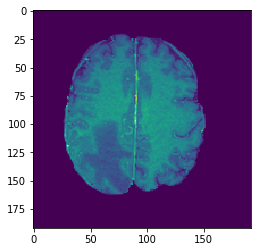

Predicted:- 


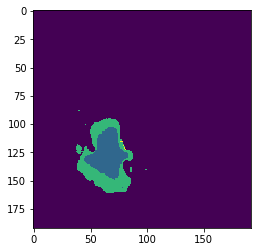

Actual:- 


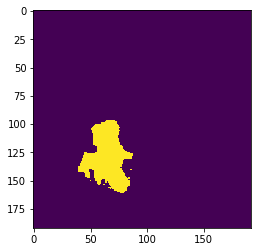

HGG test set no: 1 slice no: 490


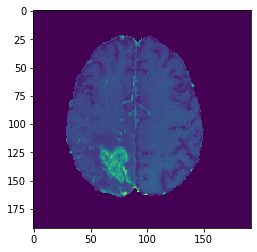

Predicted:- 


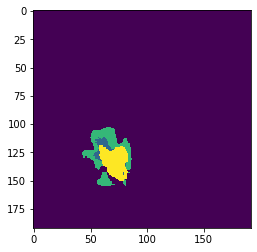

Actual:- 


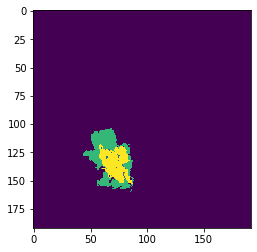

HGG test set no: 1 slice no: 491


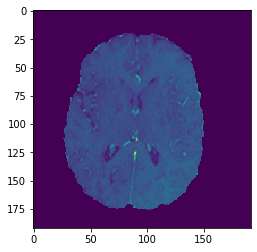

Predicted:- 


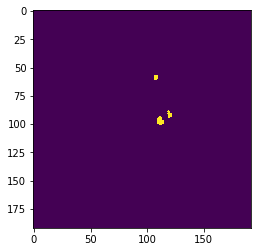

Actual:- 


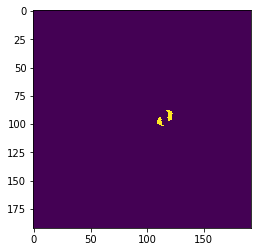

HGG test set no: 1 slice no: 492


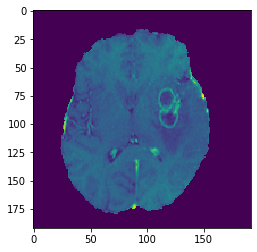

Predicted:- 


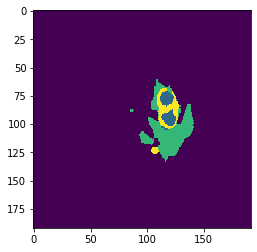

Actual:- 


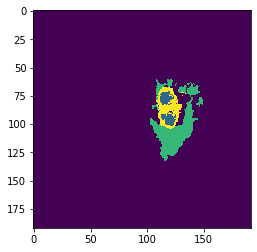

HGG test set no: 1 slice no: 493


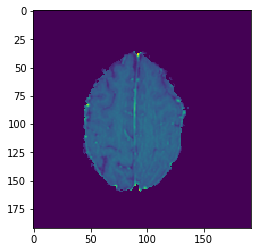

Predicted:- 


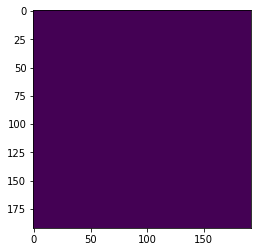

Actual:- 


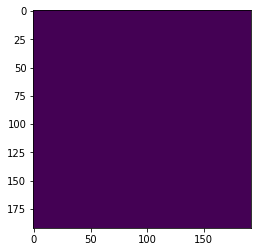

HGG test set no: 1 slice no: 494


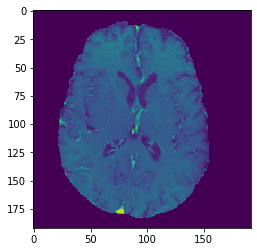

Predicted:- 


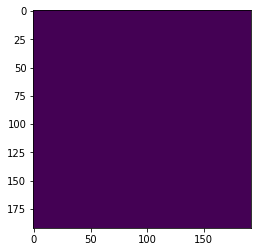

Actual:- 


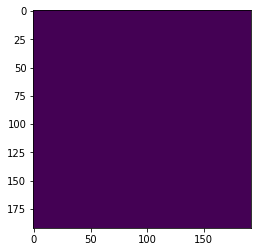

HGG test set no: 1 slice no: 495


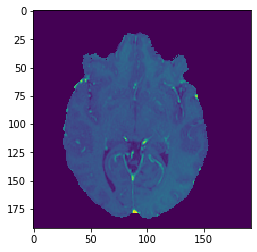

Predicted:- 


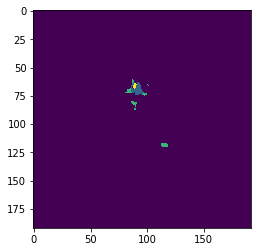

Actual:- 


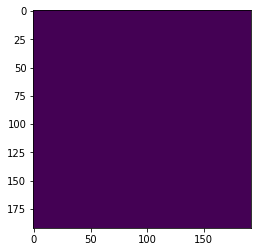

HGG test set no: 1 slice no: 496


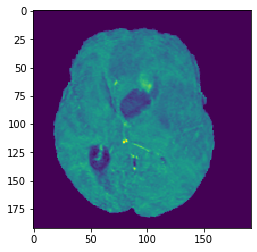

Predicted:- 


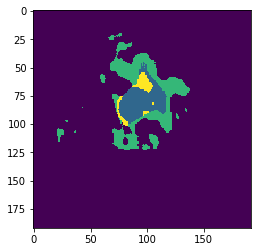

Actual:- 


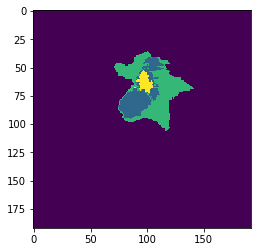

HGG test set no: 1 slice no: 497


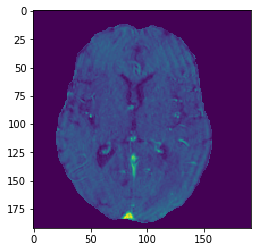

Predicted:- 


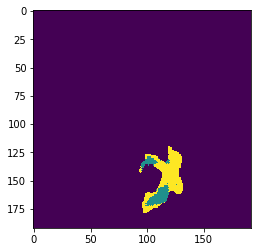

Actual:- 


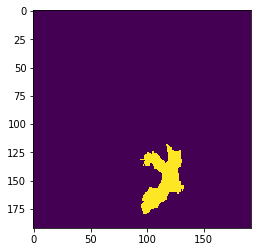

HGG test set no: 1 slice no: 498


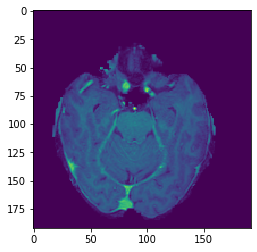

Predicted:- 


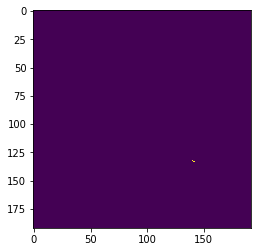

Actual:- 


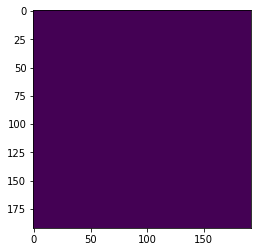

HGG test set no: 1 slice no: 499


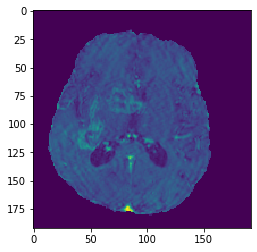

Predicted:- 


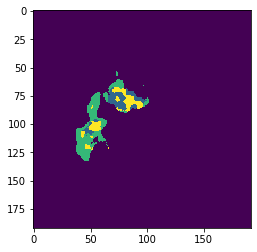

Actual:- 


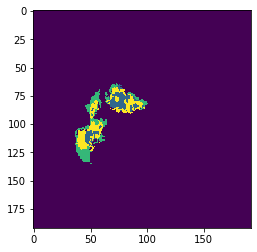

HGG test set no: 2 slice no: 450


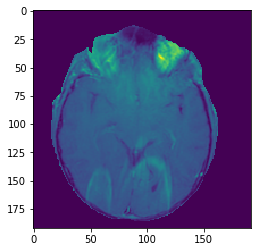

Predicted:- 


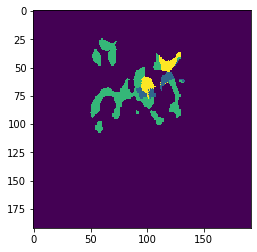

Actual:- 


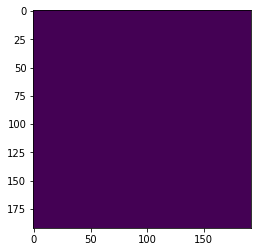

HGG test set no: 2 slice no: 451


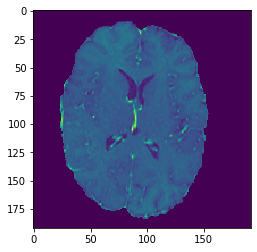

Predicted:- 


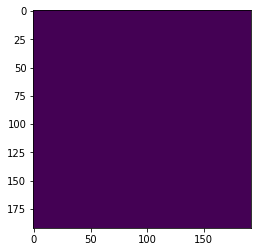

Actual:- 


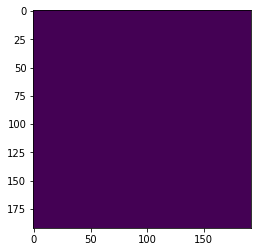

HGG test set no: 2 slice no: 452


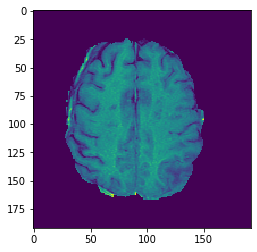

Predicted:- 


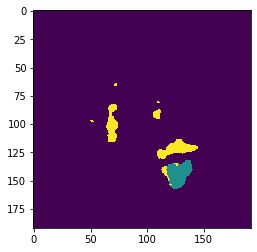

Actual:- 


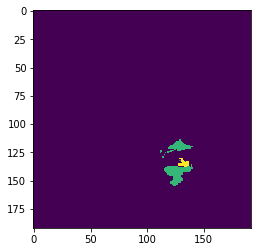

HGG test set no: 2 slice no: 453


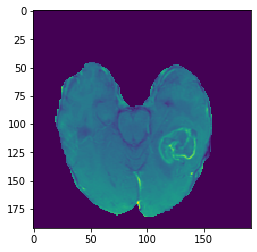

Predicted:- 


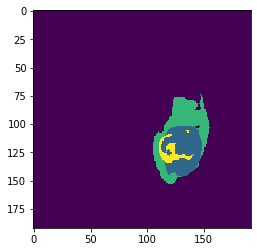

Actual:- 


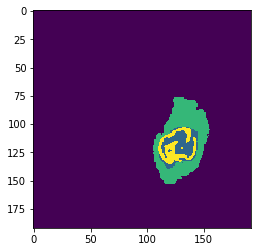

HGG test set no: 2 slice no: 454


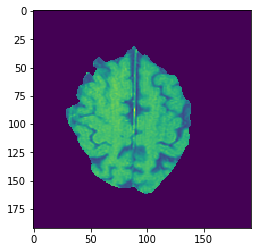

Predicted:- 


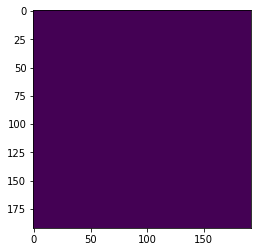

Actual:- 


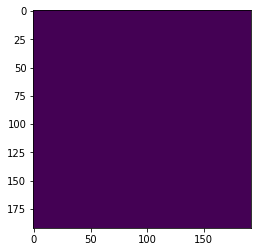

HGG test set no: 2 slice no: 455


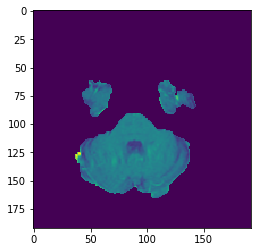

Predicted:- 


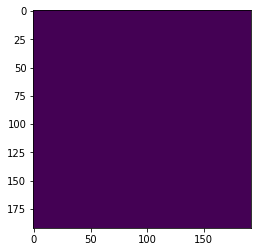

Actual:- 


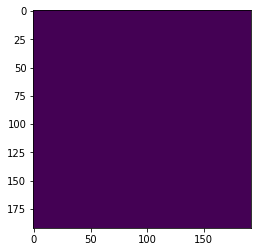

HGG test set no: 2 slice no: 456


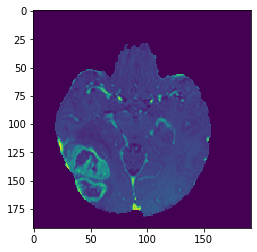

Predicted:- 


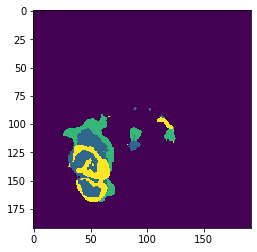

Actual:- 


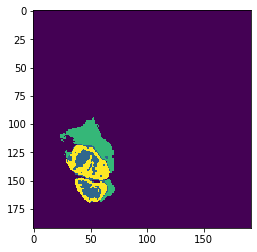

HGG test set no: 2 slice no: 457


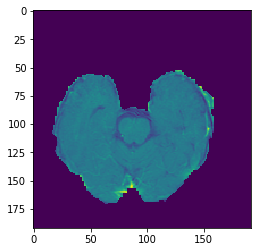

Predicted:- 


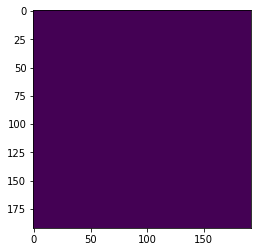

Actual:- 


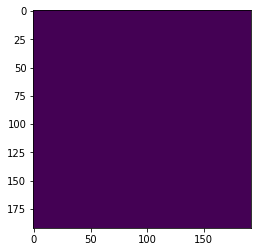

HGG test set no: 2 slice no: 458


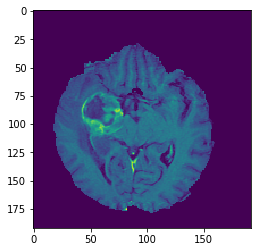

Predicted:- 


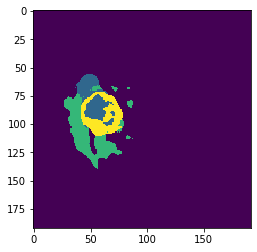

Actual:- 


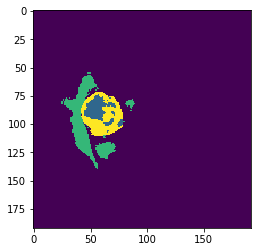

HGG test set no: 2 slice no: 459


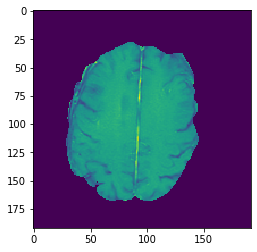

Predicted:- 


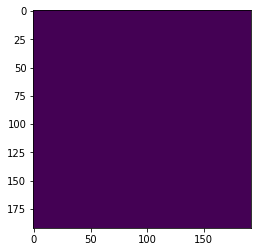

Actual:- 


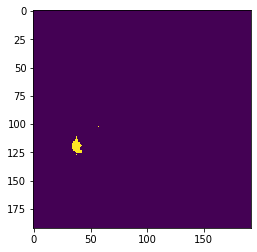

HGG test set no: 2 slice no: 460


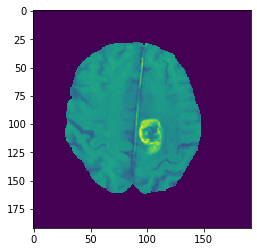

Predicted:- 


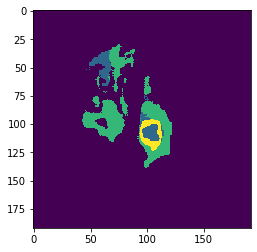

Actual:- 


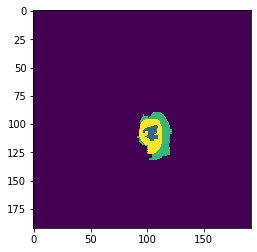

HGG test set no: 2 slice no: 461


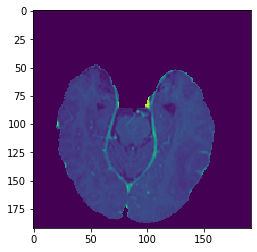

Predicted:- 


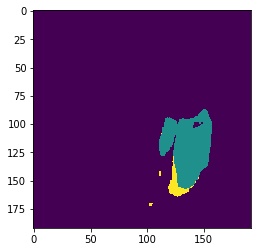

Actual:- 


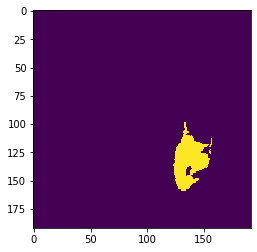

HGG test set no: 2 slice no: 462


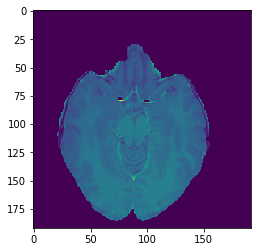

Predicted:- 


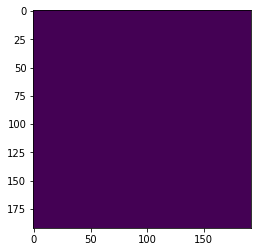

Actual:- 


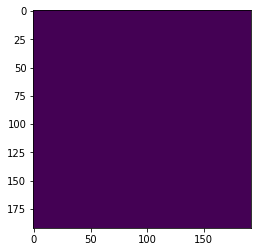

HGG test set no: 2 slice no: 463


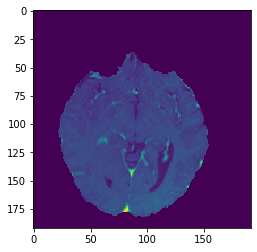

Predicted:- 


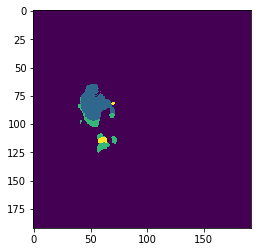

Actual:- 


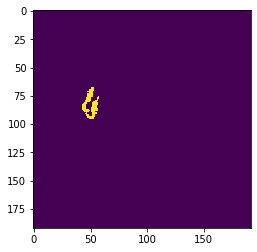

HGG test set no: 2 slice no: 464


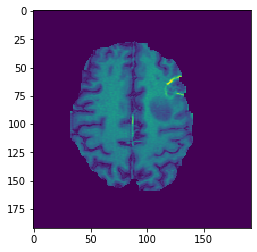

Predicted:- 


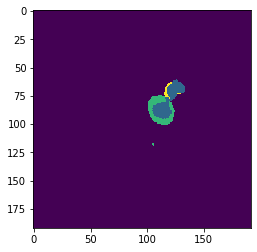

Actual:- 


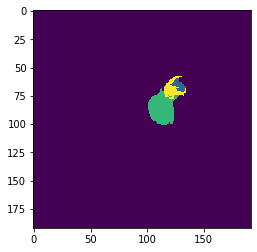

HGG test set no: 2 slice no: 465


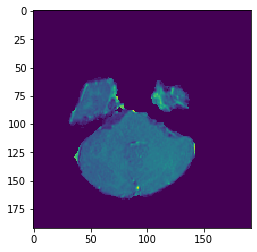

Predicted:- 


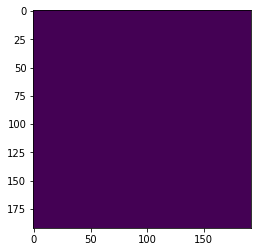

Actual:- 


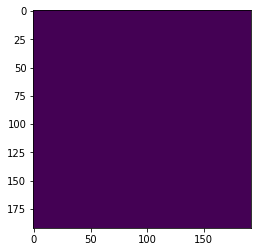

HGG test set no: 2 slice no: 466


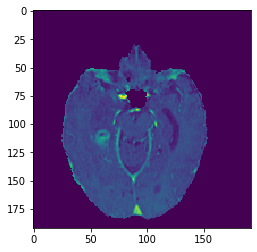

Predicted:- 


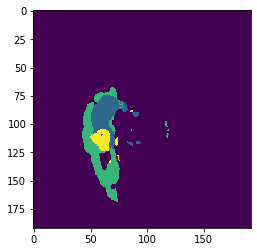

Actual:- 


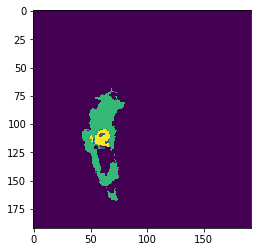

HGG test set no: 2 slice no: 467


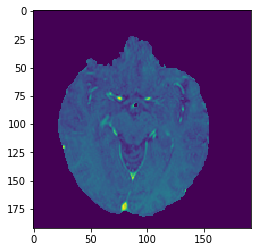

Predicted:- 


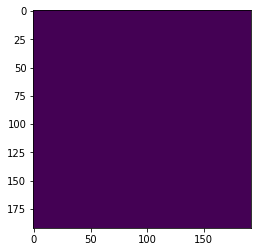

Actual:- 


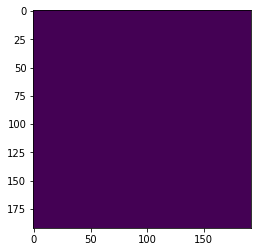

HGG test set no: 2 slice no: 468


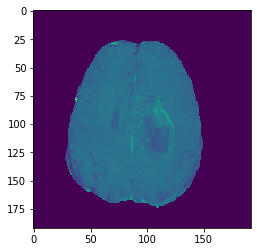

Predicted:- 


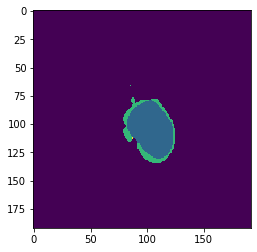

Actual:- 


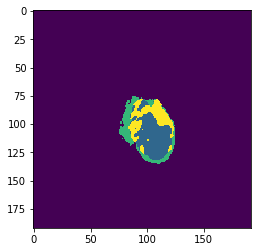

HGG test set no: 2 slice no: 469


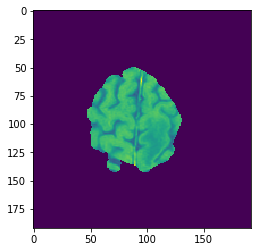

Predicted:- 


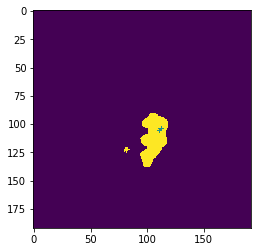

Actual:- 


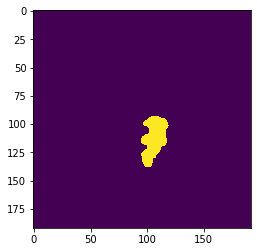

HGG test set no: 2 slice no: 470


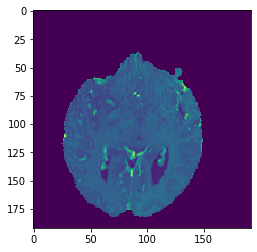

Predicted:- 


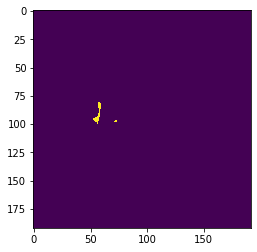

Actual:- 


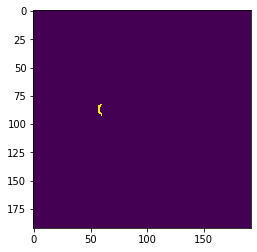

HGG test set no: 2 slice no: 471


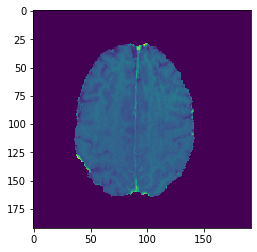

Predicted:- 


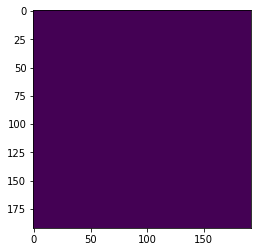

Actual:- 


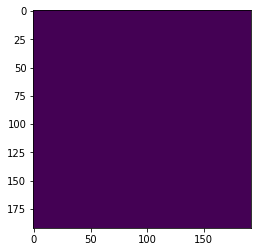

HGG test set no: 2 slice no: 472


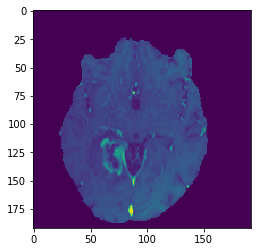

Predicted:- 


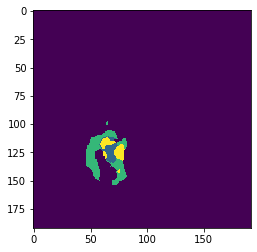

Actual:- 


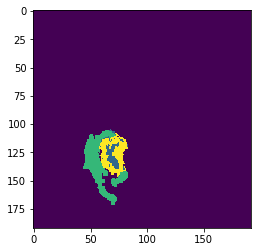

HGG test set no: 2 slice no: 473


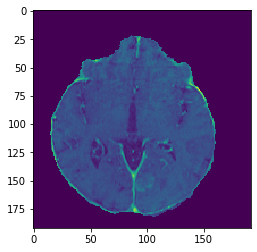

Predicted:- 


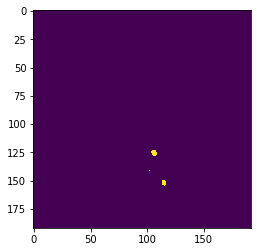

Actual:- 


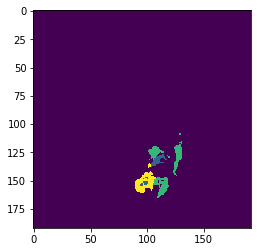

HGG test set no: 2 slice no: 474


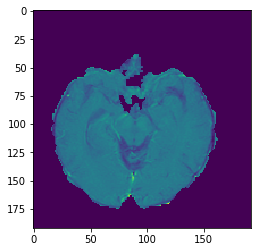

Predicted:- 


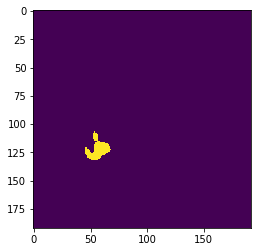

Actual:- 


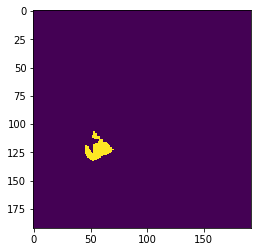

HGG test set no: 2 slice no: 475


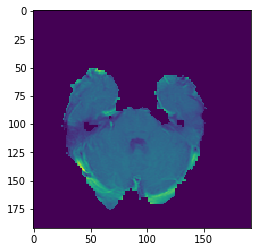

Predicted:- 


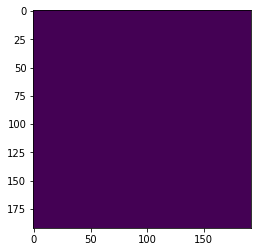

Actual:- 


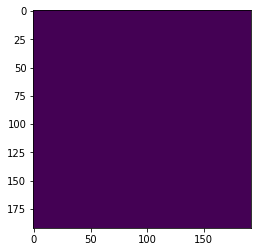

HGG test set no: 2 slice no: 476


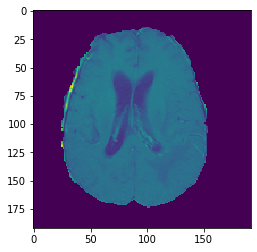

Predicted:- 


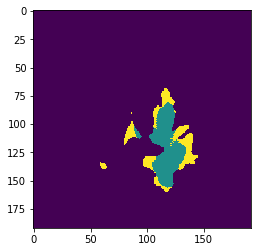

Actual:- 


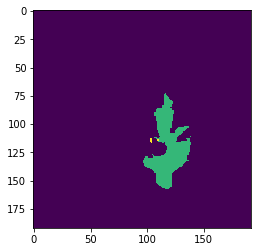

HGG test set no: 2 slice no: 477


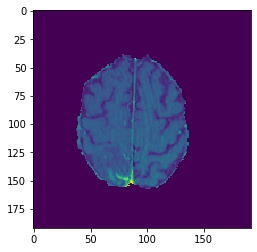

Predicted:- 


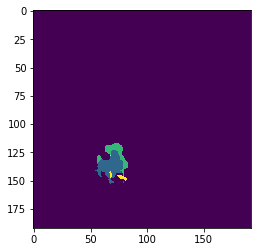

Actual:- 


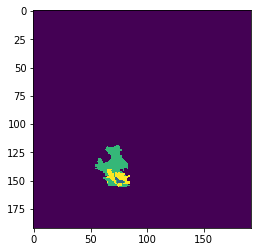

HGG test set no: 2 slice no: 478


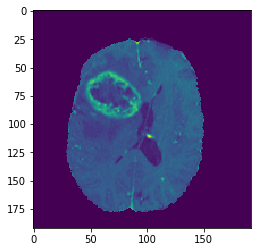

Predicted:- 


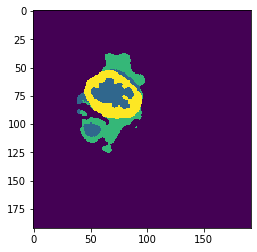

Actual:- 


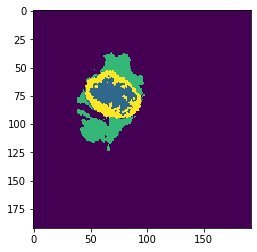

HGG test set no: 2 slice no: 479


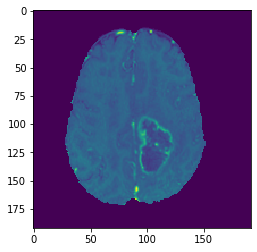

Predicted:- 


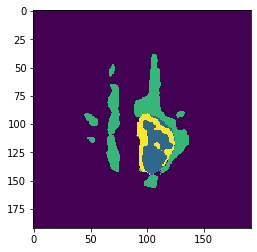

Actual:- 


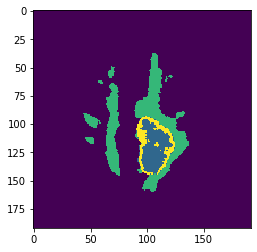

HGG test set no: 2 slice no: 480


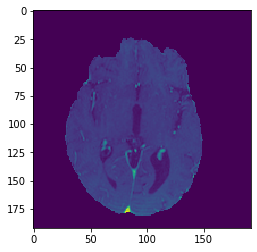

Predicted:- 


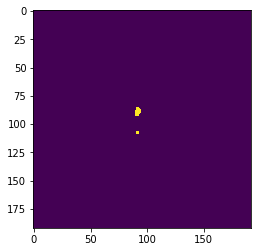

Actual:- 


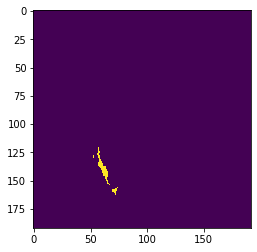

HGG test set no: 2 slice no: 481


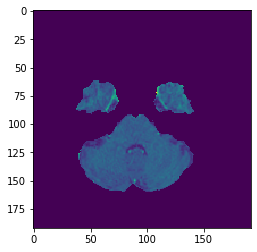

Predicted:- 


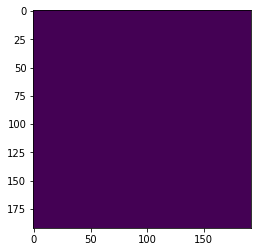

Actual:- 


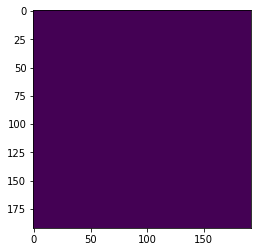

HGG test set no: 2 slice no: 482


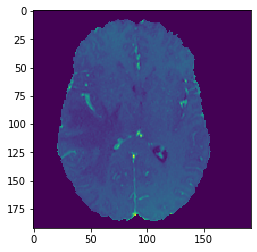

Predicted:- 


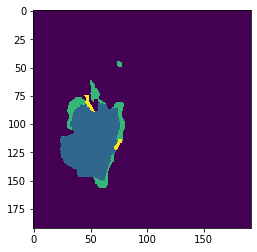

Actual:- 


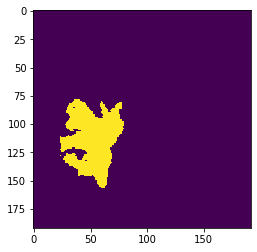

HGG test set no: 2 slice no: 483


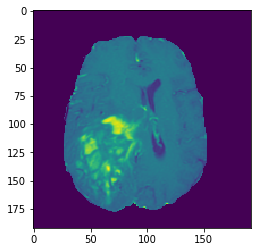

Predicted:- 


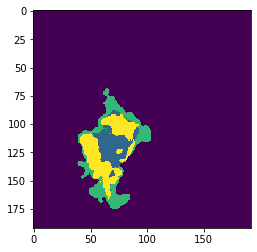

Actual:- 


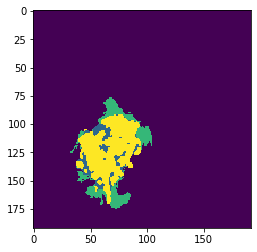

HGG test set no: 2 slice no: 484


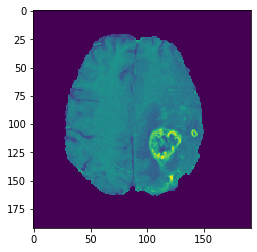

Predicted:- 


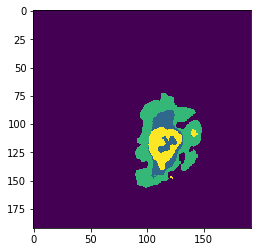

Actual:- 


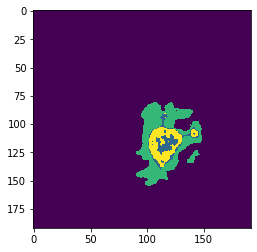

HGG test set no: 2 slice no: 485


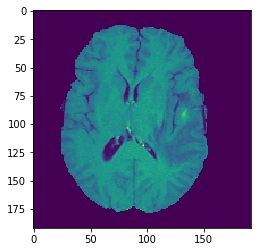

Predicted:- 


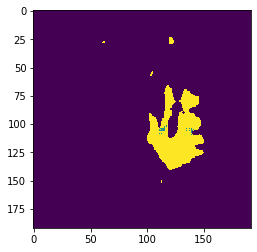

Actual:- 


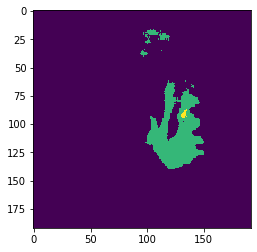

HGG test set no: 2 slice no: 486


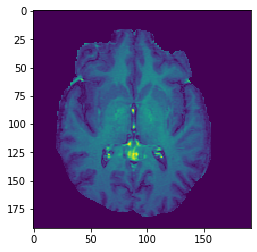

Predicted:- 


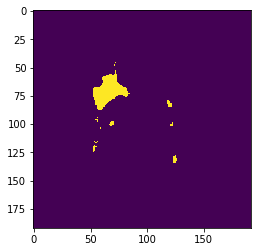

Actual:- 


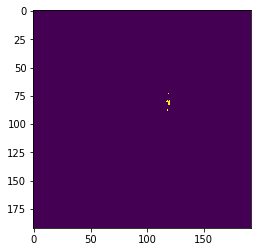

HGG test set no: 2 slice no: 487


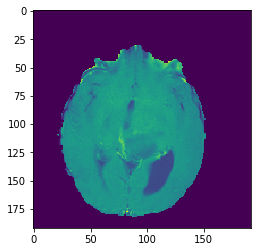

Predicted:- 


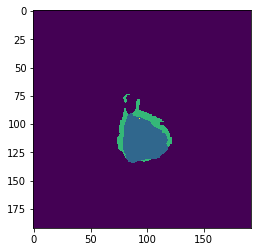

Actual:- 


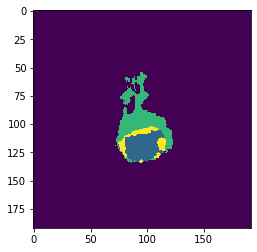

HGG test set no: 2 slice no: 488


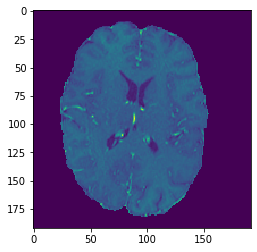

Predicted:- 


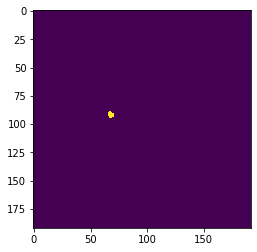

Actual:- 


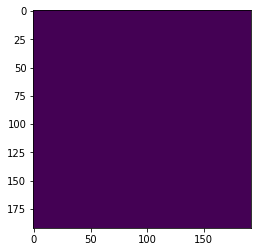

HGG test set no: 2 slice no: 489


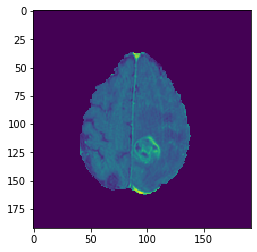

Predicted:- 


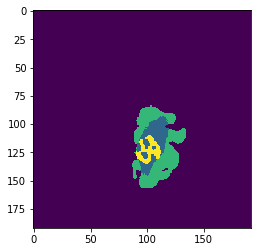

Actual:- 


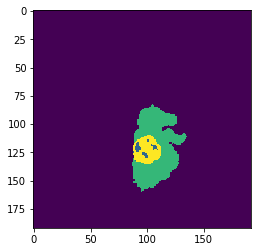

HGG test set no: 2 slice no: 490


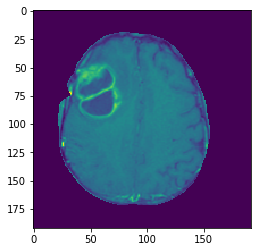

Predicted:- 


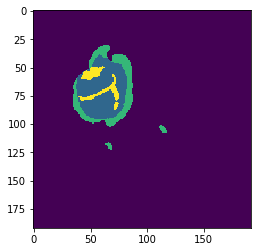

Actual:- 


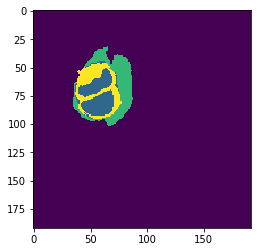

HGG test set no: 2 slice no: 491


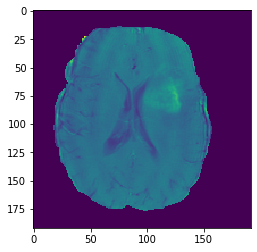

Predicted:- 


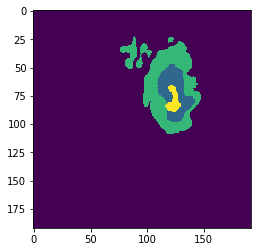

Actual:- 


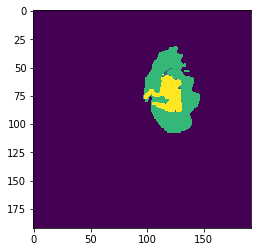

HGG test set no: 2 slice no: 492


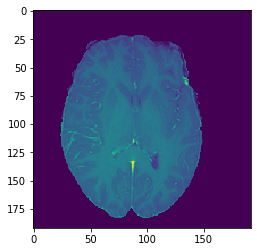

Predicted:- 


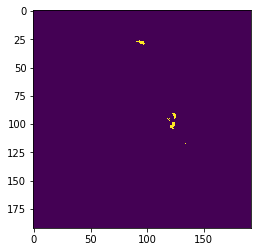

Actual:- 


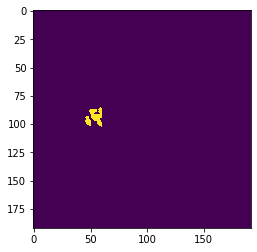

HGG test set no: 2 slice no: 493


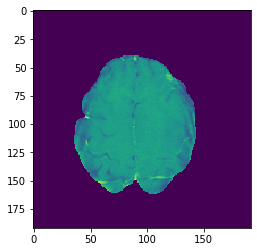

Predicted:- 


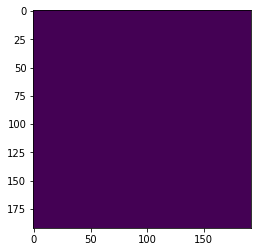

Actual:- 


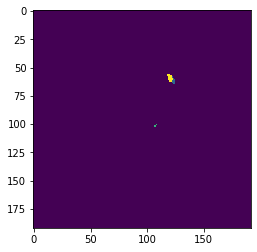

HGG test set no: 2 slice no: 494


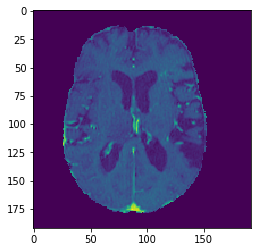

Predicted:- 


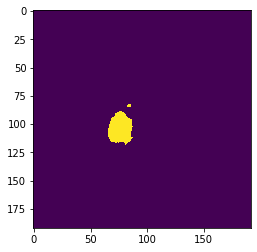

Actual:- 


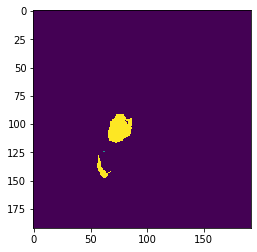

HGG test set no: 2 slice no: 495


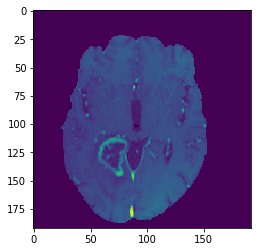

Predicted:- 


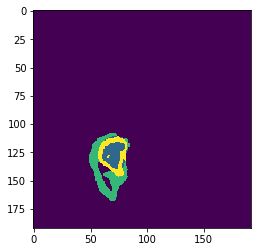

Actual:- 


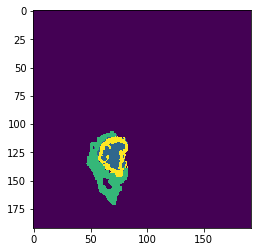

HGG test set no: 2 slice no: 496


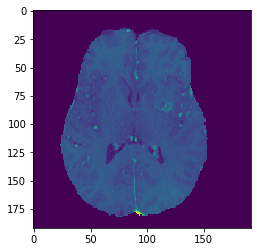

Predicted:- 


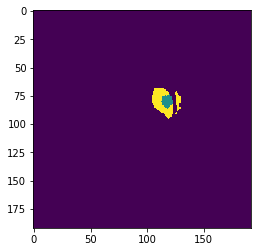

Actual:- 


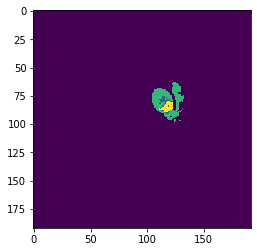

HGG test set no: 2 slice no: 497


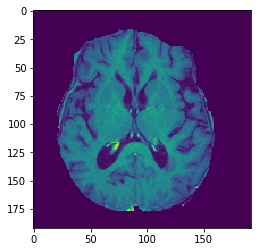

Predicted:- 


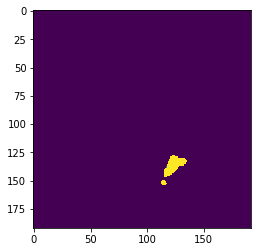

Actual:- 


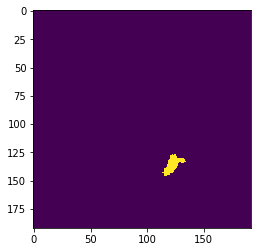

HGG test set no: 2 slice no: 498


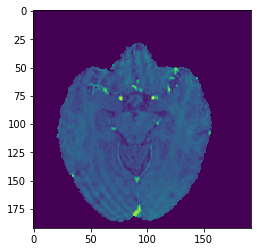

Predicted:- 


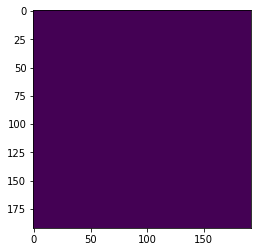

Actual:- 


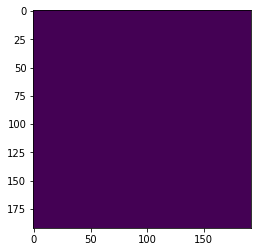

HGG test set no: 2 slice no: 499


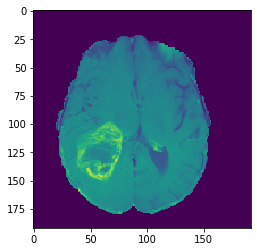

Predicted:- 


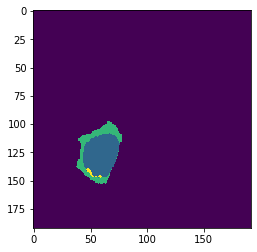

Actual:- 


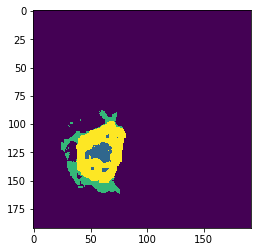

HGG test set no: 3 slice no: 450


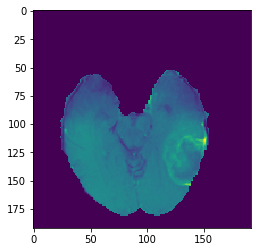

Predicted:- 


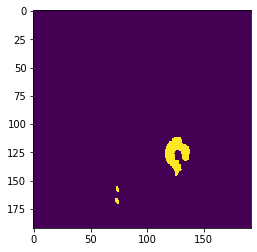

Actual:- 


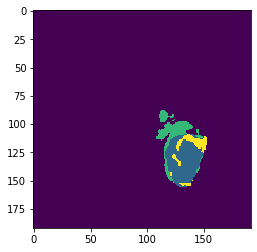

HGG test set no: 3 slice no: 451


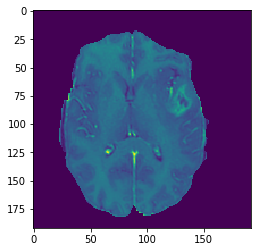

Predicted:- 


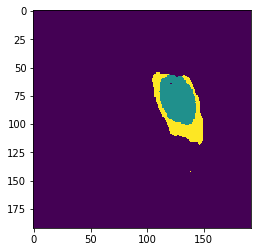

Actual:- 


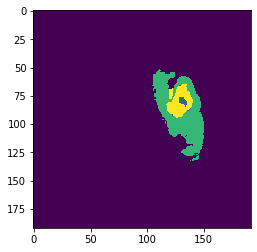

HGG test set no: 3 slice no: 452


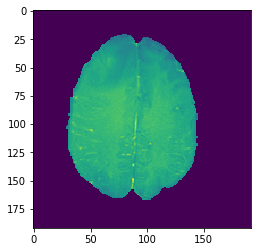

Predicted:- 


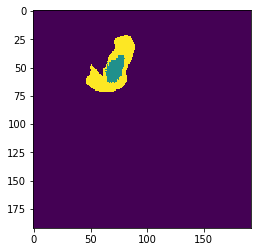

Actual:- 


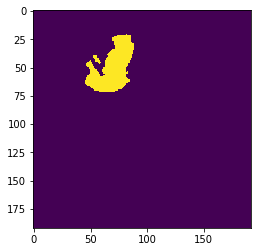

HGG test set no: 3 slice no: 453


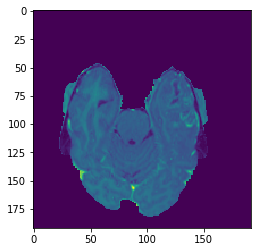

Predicted:- 


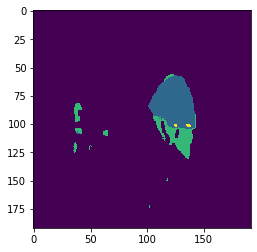

Actual:- 


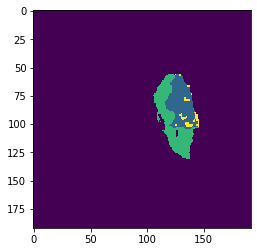

HGG test set no: 3 slice no: 454


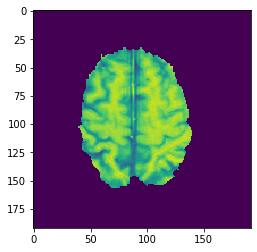

Predicted:- 


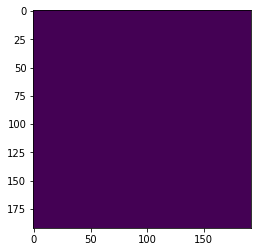

Actual:- 


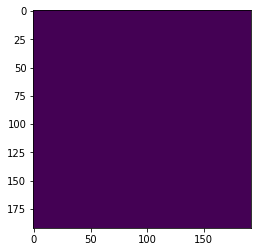

HGG test set no: 3 slice no: 455


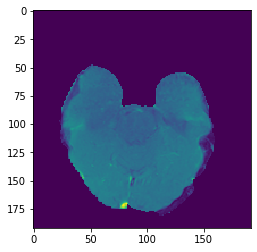

Predicted:- 


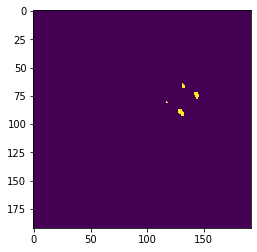

Actual:- 


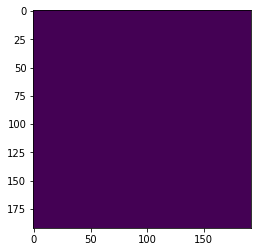

HGG test set no: 3 slice no: 456


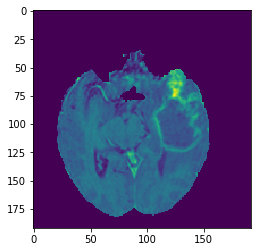

Predicted:- 


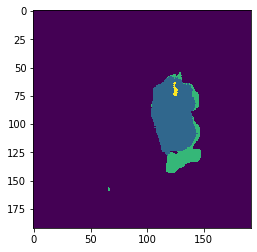

Actual:- 


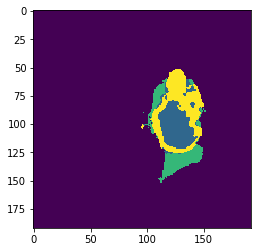

HGG test set no: 3 slice no: 457


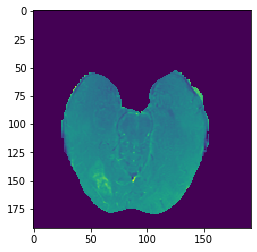

Predicted:- 


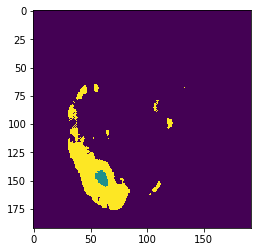

Actual:- 


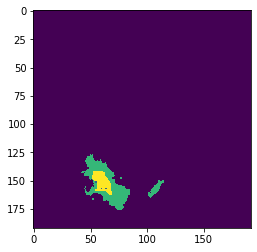

HGG test set no: 3 slice no: 458


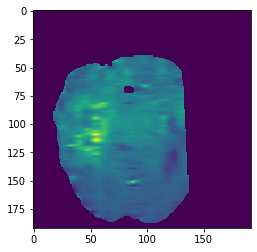

Predicted:- 


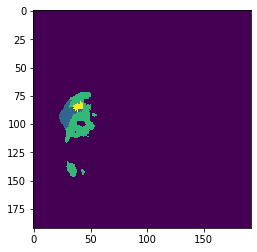

Actual:- 


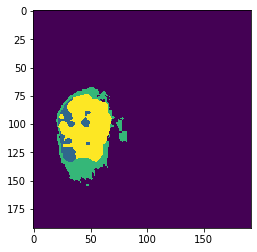

HGG test set no: 3 slice no: 459


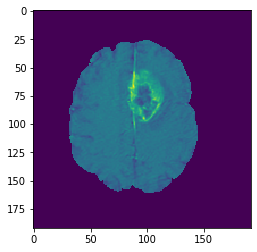

Predicted:- 


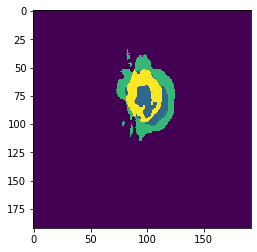

Actual:- 


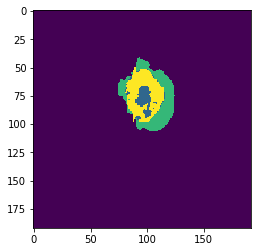

HGG test set no: 3 slice no: 460


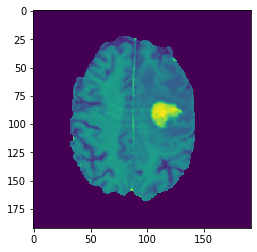

Predicted:- 


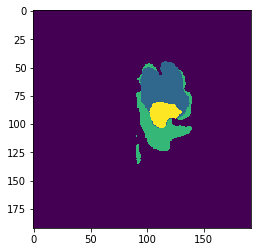

Actual:- 


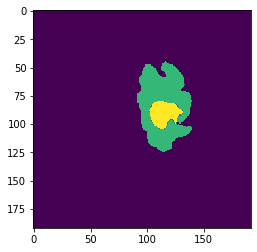

HGG test set no: 3 slice no: 461


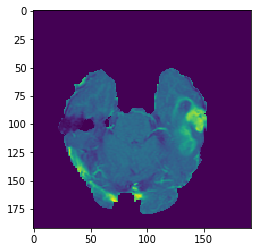

Predicted:- 


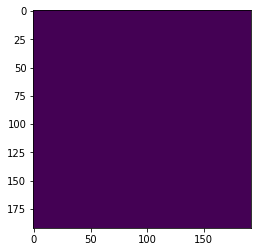

Actual:- 


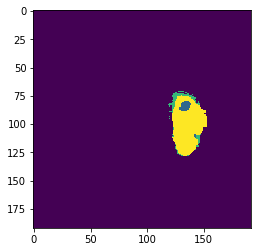

HGG test set no: 3 slice no: 462


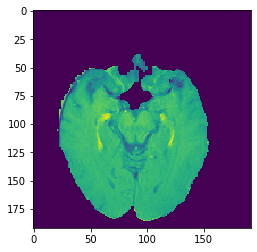

Predicted:- 


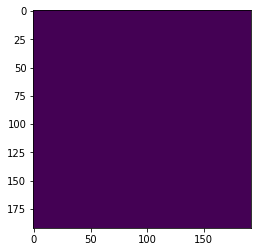

Actual:- 


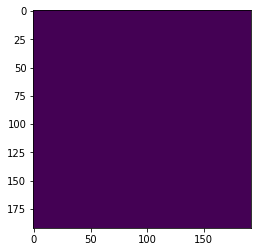

HGG test set no: 3 slice no: 463


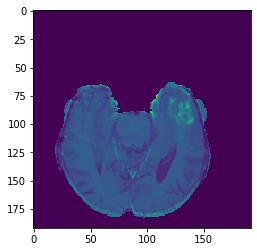

Predicted:- 


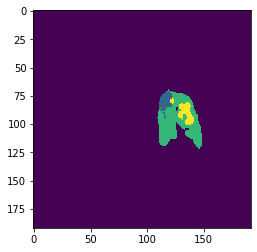

Actual:- 


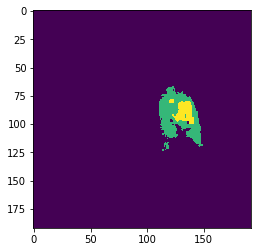

HGG test set no: 3 slice no: 464


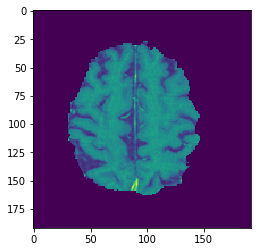

Predicted:- 


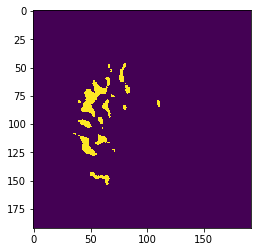

Actual:- 


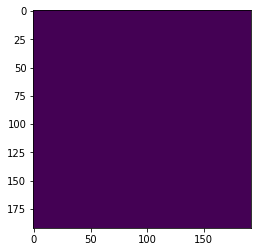

HGG test set no: 3 slice no: 465


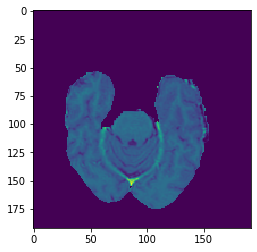

Predicted:- 


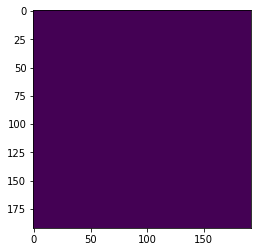

Actual:- 


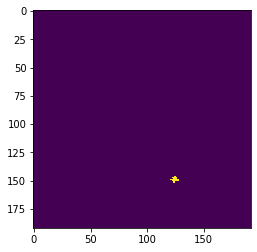

HGG test set no: 3 slice no: 466


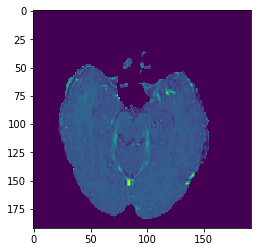

Predicted:- 


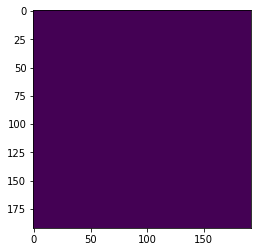

Actual:- 


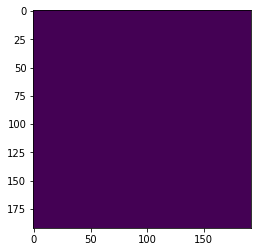

HGG test set no: 3 slice no: 467


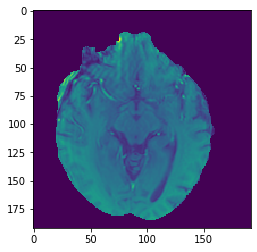

Predicted:- 


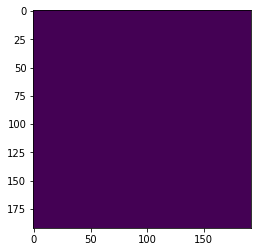

Actual:- 


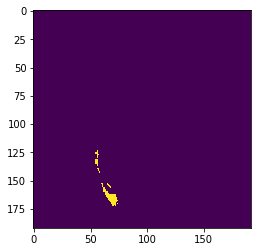

HGG test set no: 3 slice no: 468


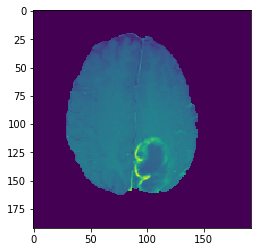

Predicted:- 


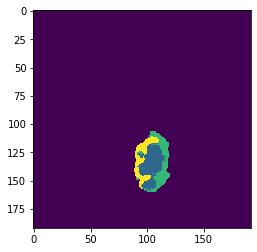

Actual:- 


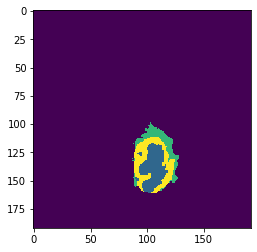

HGG test set no: 3 slice no: 469


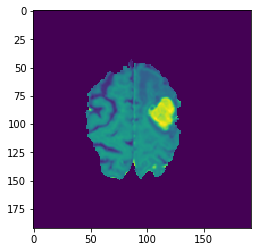

Predicted:- 


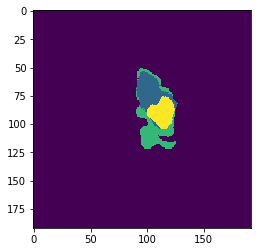

Actual:- 


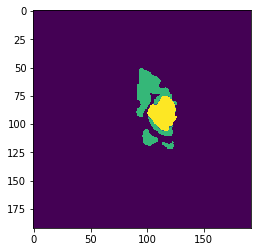

HGG test set no: 3 slice no: 470


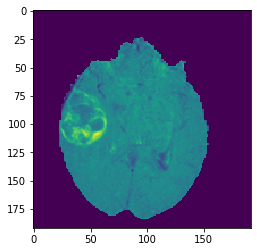

Predicted:- 


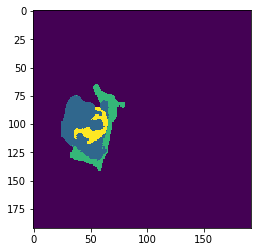

Actual:- 


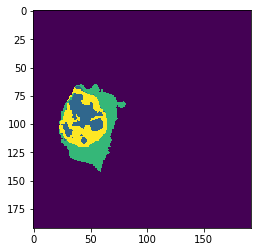

HGG test set no: 3 slice no: 471


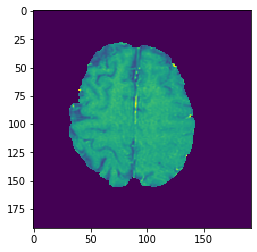

Predicted:- 


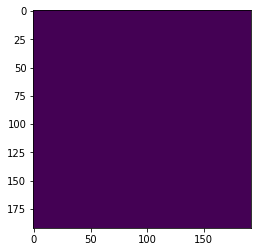

Actual:- 


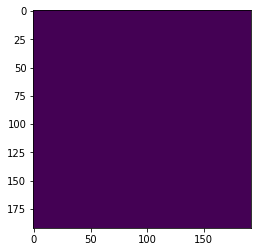

HGG test set no: 3 slice no: 472


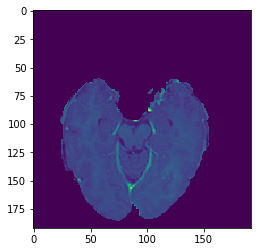

Predicted:- 


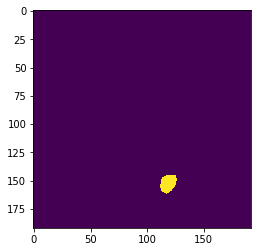

Actual:- 


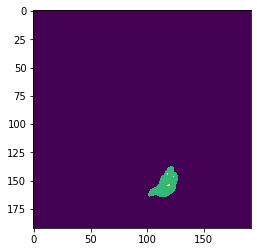

HGG test set no: 3 slice no: 473


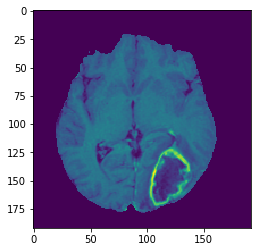

Predicted:- 


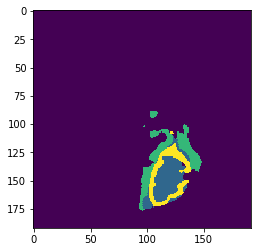

Actual:- 


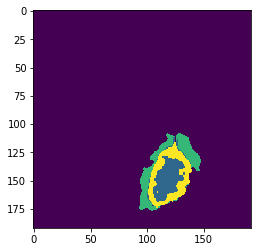

HGG test set no: 3 slice no: 474


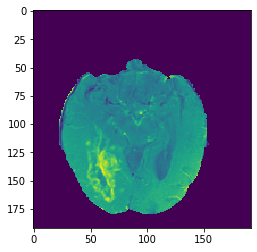

Predicted:- 


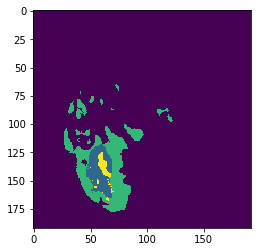

Actual:- 


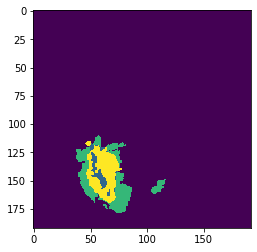

HGG test set no: 3 slice no: 475


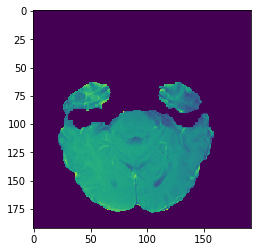

Predicted:- 


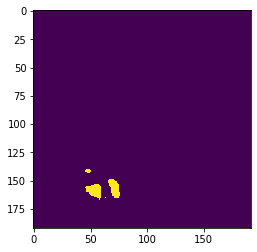

Actual:- 


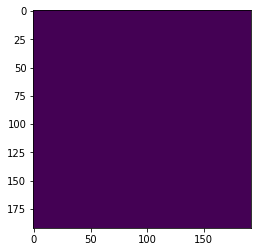

HGG test set no: 3 slice no: 476


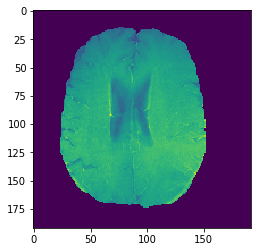

Predicted:- 


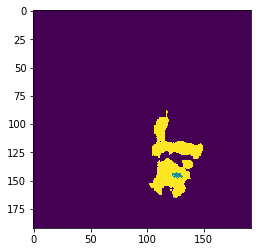

Actual:- 


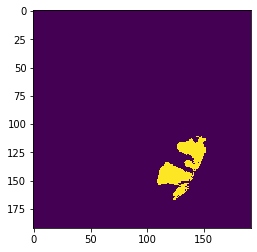

HGG test set no: 3 slice no: 477


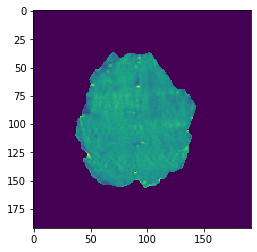

Predicted:- 


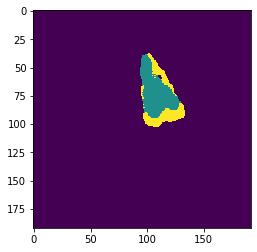

Actual:- 


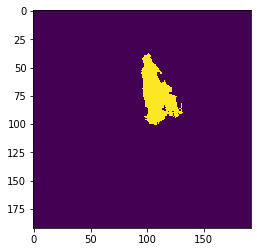

HGG test set no: 3 slice no: 478


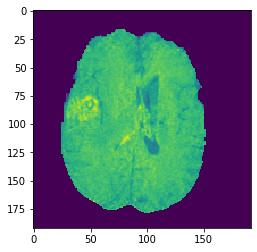

Predicted:- 


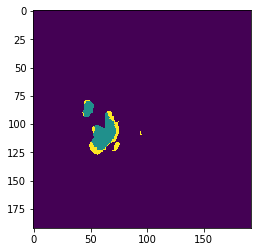

Actual:- 


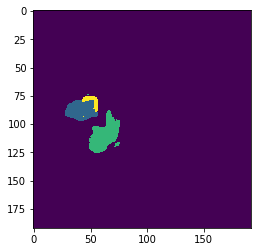

HGG test set no: 3 slice no: 479


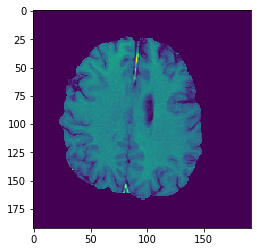

Predicted:- 


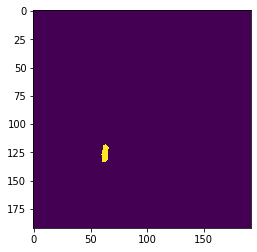

Actual:- 


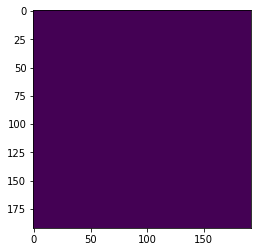

HGG test set no: 3 slice no: 480


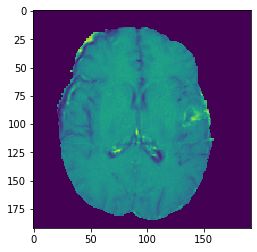

Predicted:- 


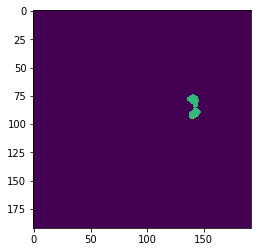

Actual:- 


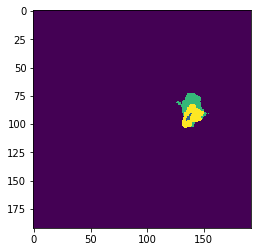

HGG test set no: 3 slice no: 481


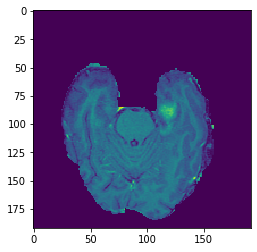

Predicted:- 


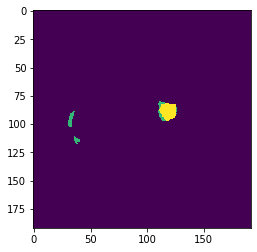

Actual:- 


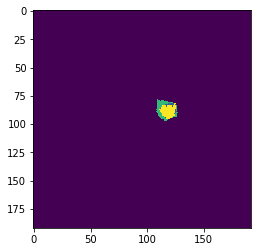

HGG test set no: 3 slice no: 482


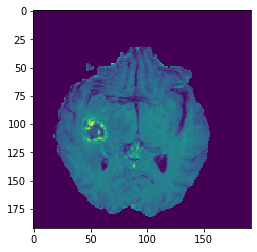

Predicted:- 


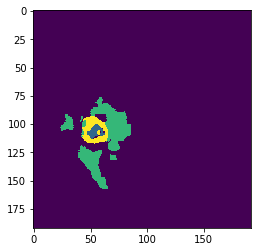

Actual:- 


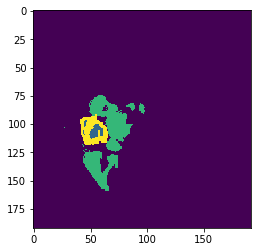

HGG test set no: 3 slice no: 483


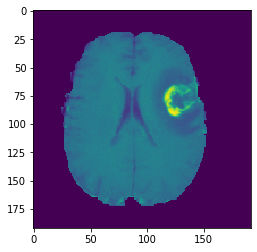

Predicted:- 


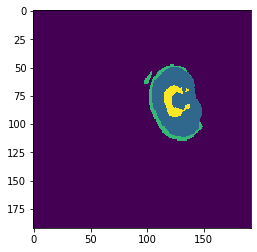

Actual:- 


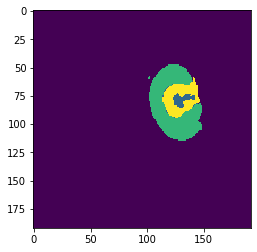

HGG test set no: 3 slice no: 484


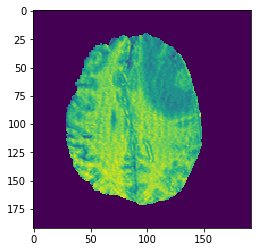

Predicted:- 


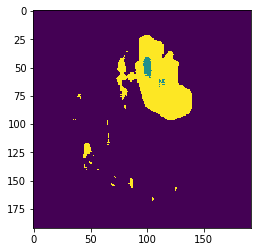

Actual:- 


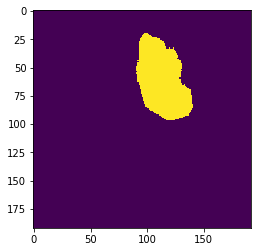

HGG test set no: 3 slice no: 485


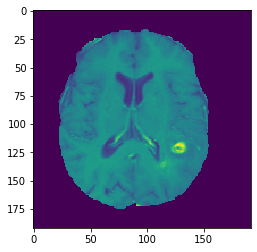

Predicted:- 


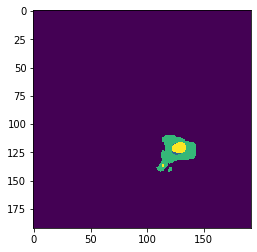

Actual:- 


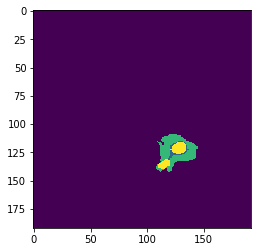

HGG test set no: 3 slice no: 486


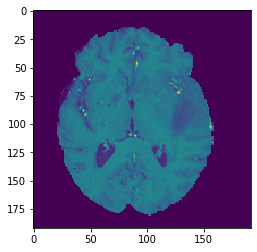

Predicted:- 


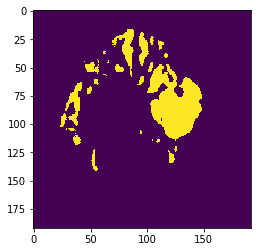

Actual:- 


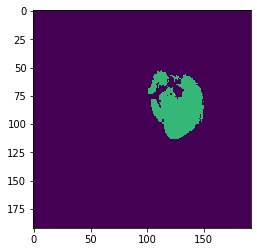

HGG test set no: 3 slice no: 487


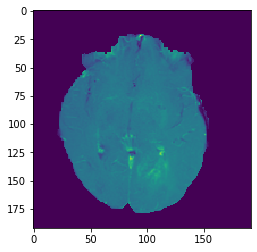

Predicted:- 


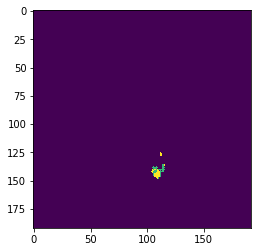

Actual:- 


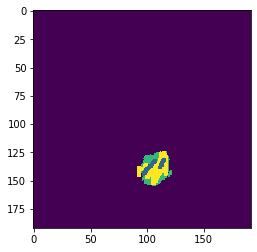

HGG test set no: 3 slice no: 488


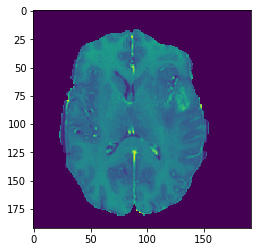

Predicted:- 


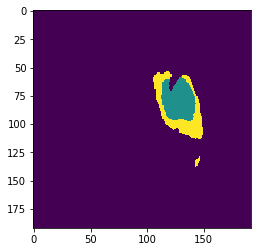

Actual:- 


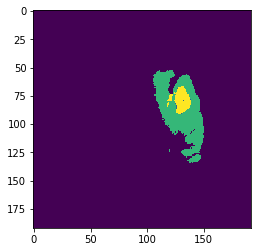

HGG test set no: 3 slice no: 489


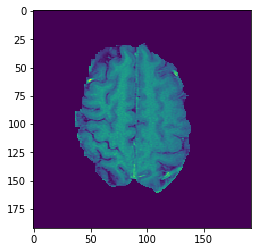

Predicted:- 


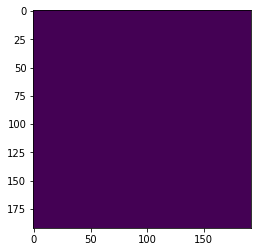

Actual:- 


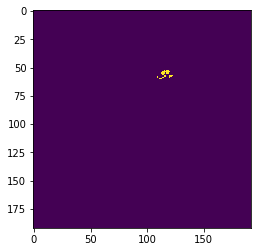

HGG test set no: 3 slice no: 490


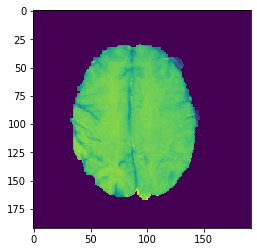

Predicted:- 


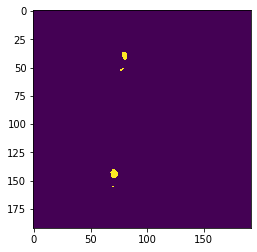

Actual:- 


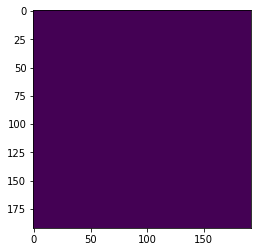

HGG test set no: 3 slice no: 491


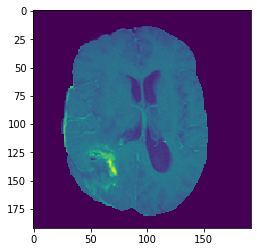

Predicted:- 


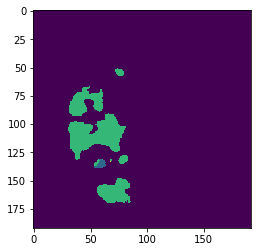

Actual:- 


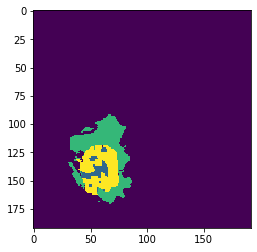

HGG test set no: 3 slice no: 492


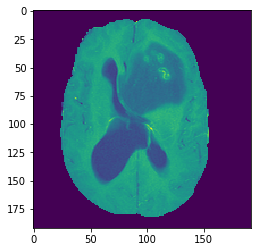

Predicted:- 


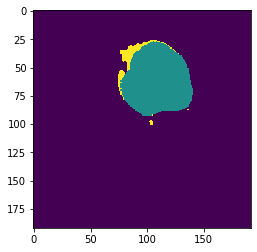

Actual:- 


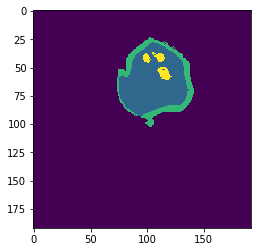

HGG test set no: 3 slice no: 493


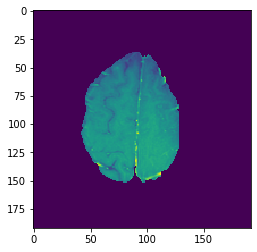

Predicted:- 


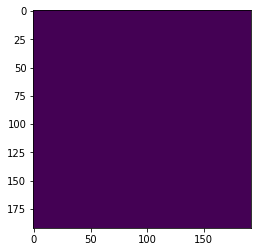

Actual:- 


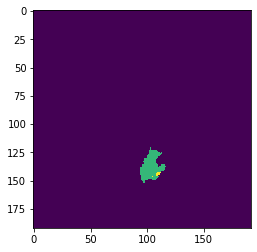

HGG test set no: 3 slice no: 494


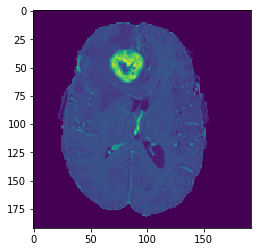

Predicted:- 


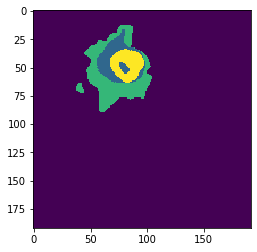

Actual:- 


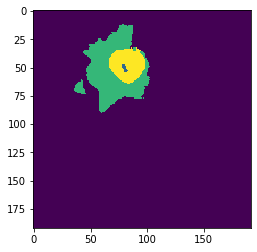

HGG test set no: 3 slice no: 495


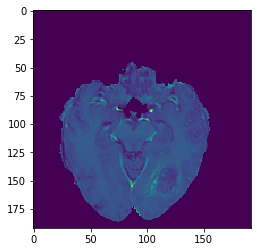

Predicted:- 


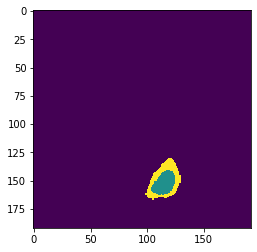

Actual:- 


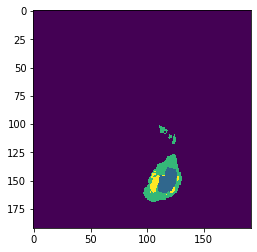

HGG test set no: 3 slice no: 496


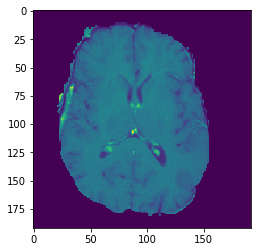

Predicted:- 


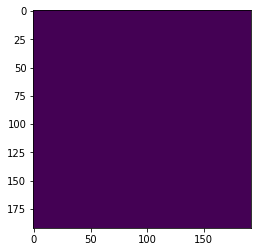

Actual:- 


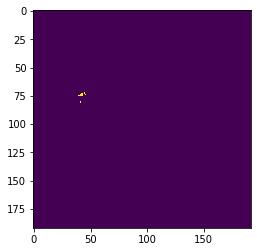

HGG test set no: 3 slice no: 497


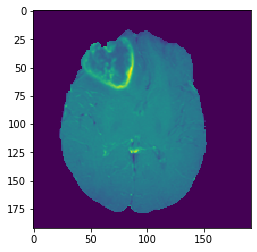

Predicted:- 


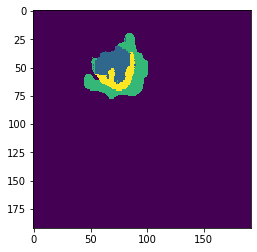

Actual:- 


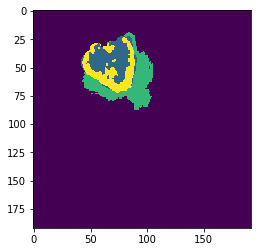

HGG test set no: 3 slice no: 498


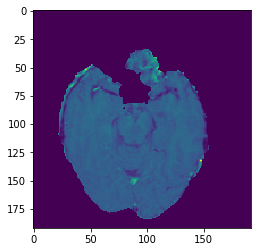

Predicted:- 


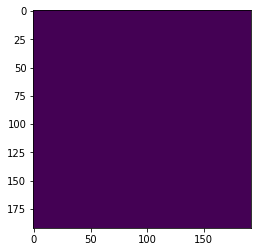

Actual:- 


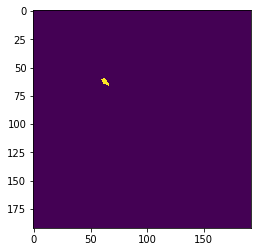

HGG test set no: 3 slice no: 499


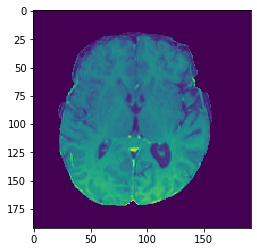

Predicted:- 


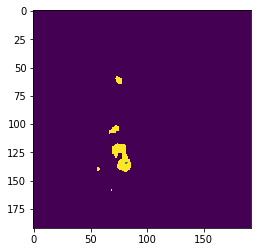

Actual:- 


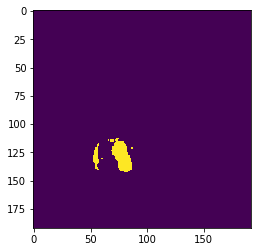

LGG test slice no: 450


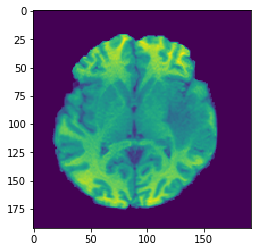

Predicted:- 


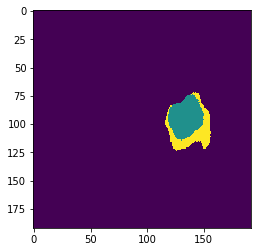

Actual:- 


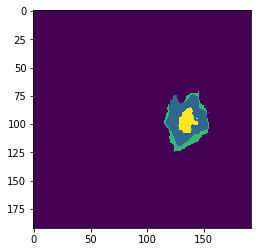

LGG test slice no: 451


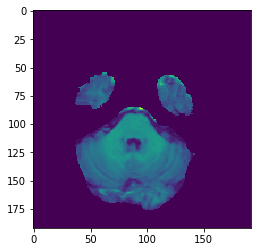

Predicted:- 


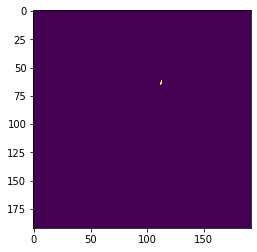

Actual:- 


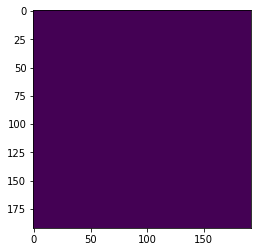

LGG test slice no: 452


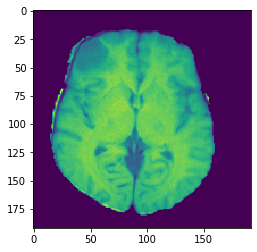

Predicted:- 


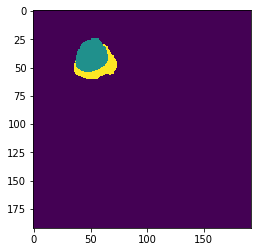

Actual:- 


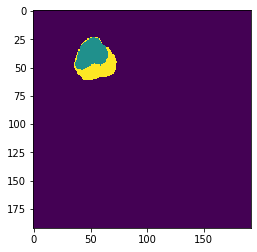

LGG test slice no: 453


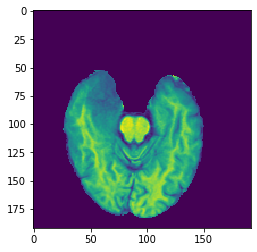

Predicted:- 


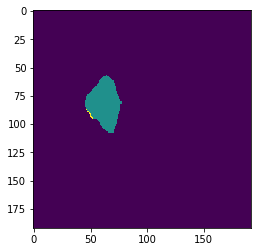

Actual:- 


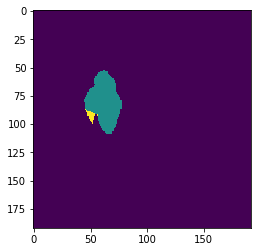

LGG test slice no: 454


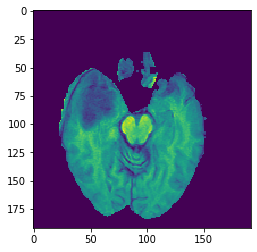

Predicted:- 


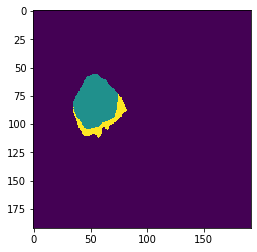

Actual:- 


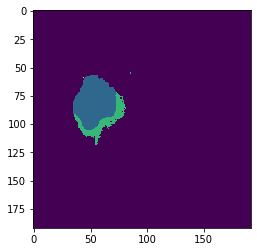

LGG test slice no: 455


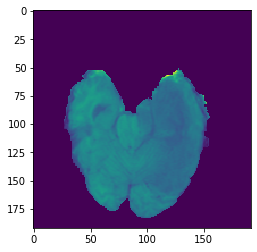

Predicted:- 


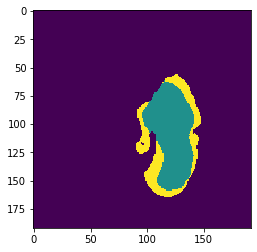

Actual:- 


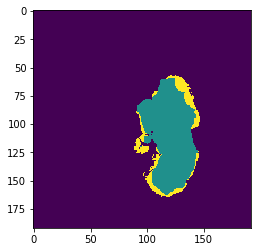

LGG test slice no: 456


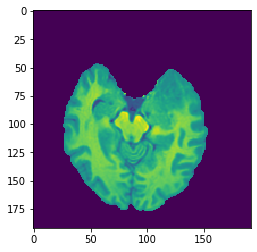

Predicted:- 


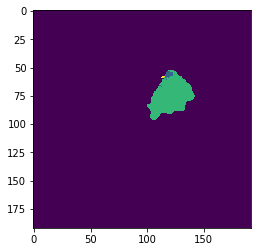

Actual:- 


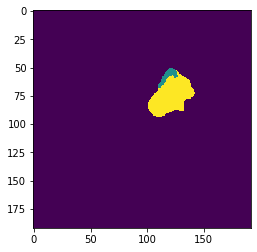

LGG test slice no: 457


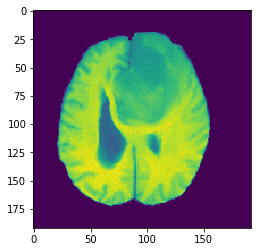

Predicted:- 


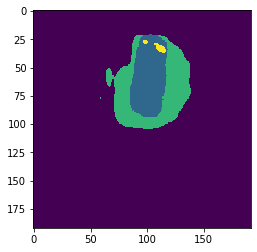

Actual:- 


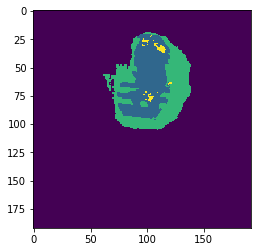

LGG test slice no: 458


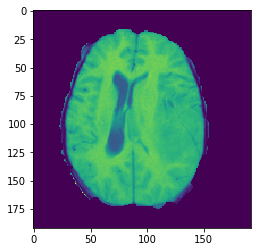

Predicted:- 


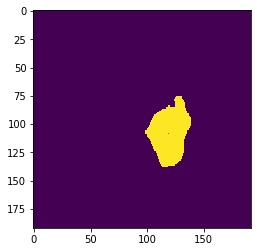

Actual:- 


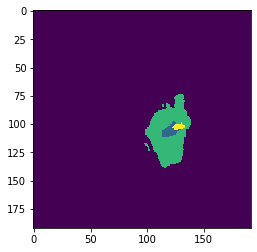

LGG test slice no: 459


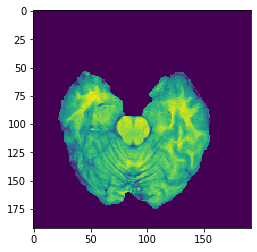

Predicted:- 


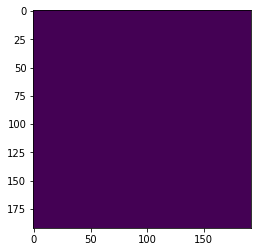

Actual:- 


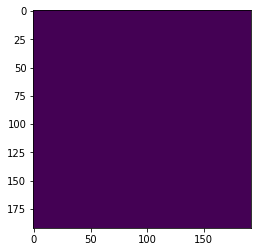

LGG test slice no: 460


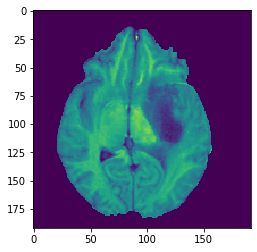

Predicted:- 


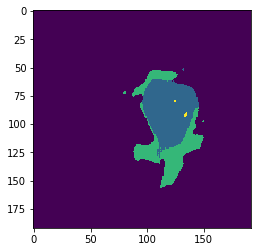

Actual:- 


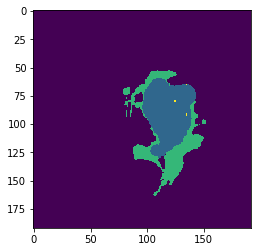

LGG test slice no: 461


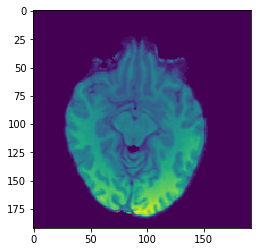

Predicted:- 


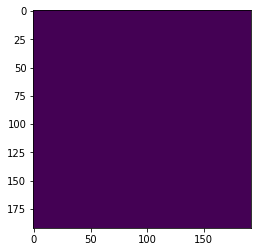

Actual:- 


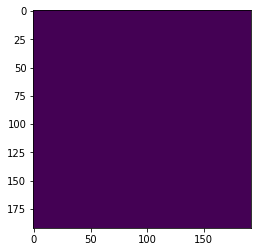

LGG test slice no: 462


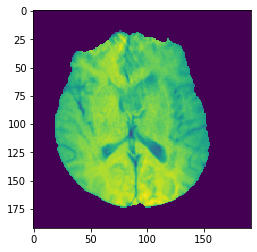

Predicted:- 


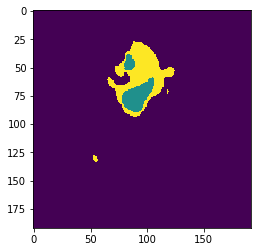

Actual:- 


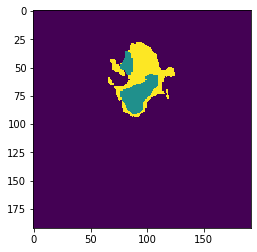

LGG test slice no: 463


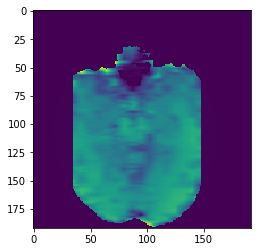

Predicted:- 


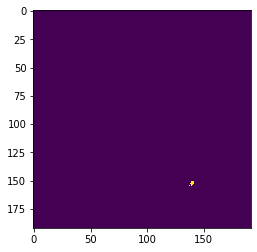

Actual:- 


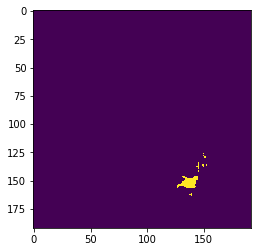

LGG test slice no: 464


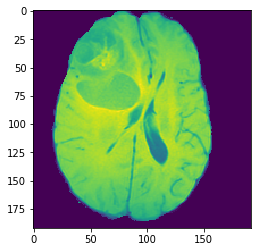

Predicted:- 


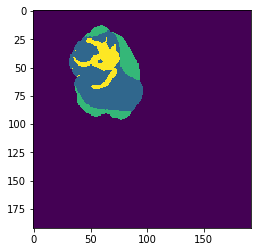

Actual:- 


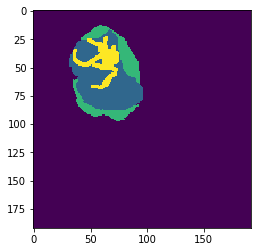

LGG test slice no: 465


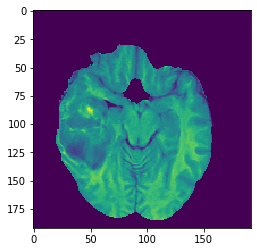

Predicted:- 


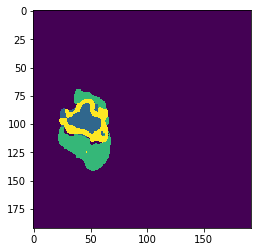

Actual:- 


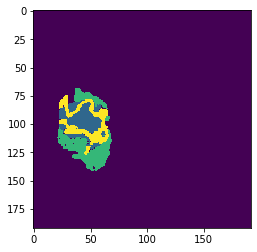

LGG test slice no: 466


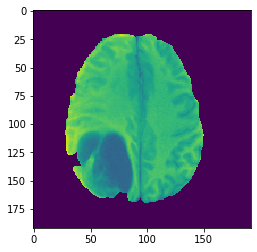

Predicted:- 


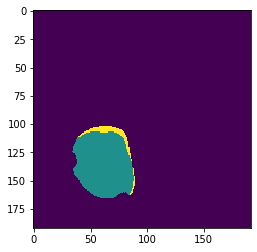

Actual:- 


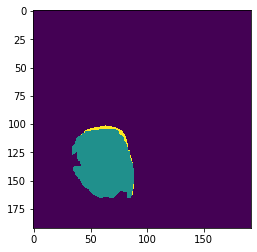

LGG test slice no: 467


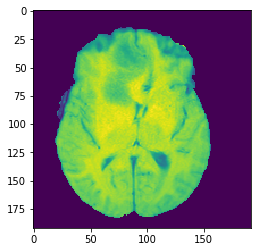

Predicted:- 


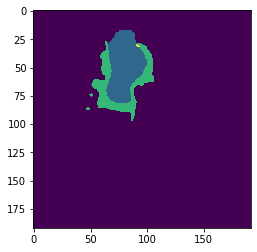

Actual:- 


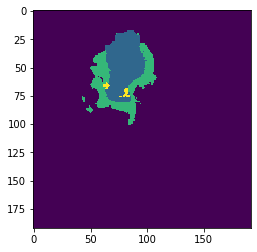

LGG test slice no: 468


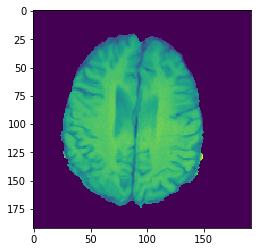

Predicted:- 


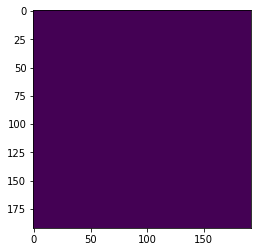

Actual:- 


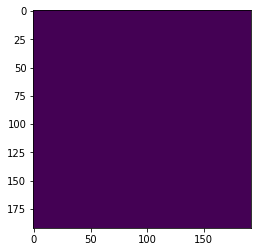

LGG test slice no: 469


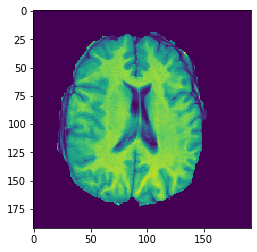

Predicted:- 


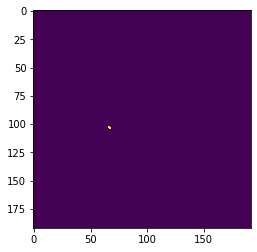

Actual:- 


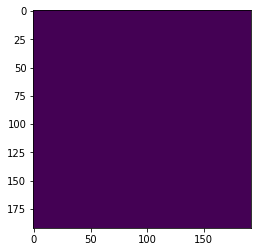

LGG test slice no: 470


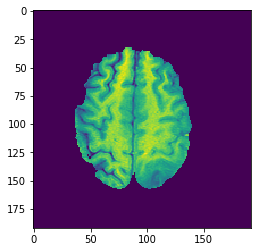

Predicted:- 


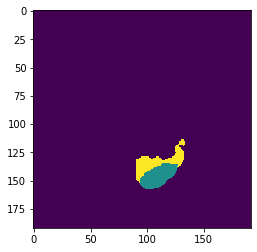

Actual:- 


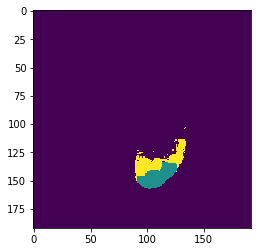

LGG test slice no: 471


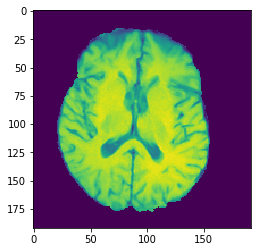

Predicted:- 


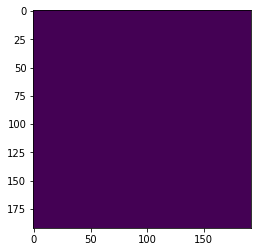

Actual:- 


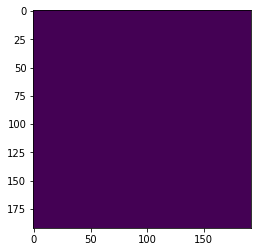

LGG test slice no: 472


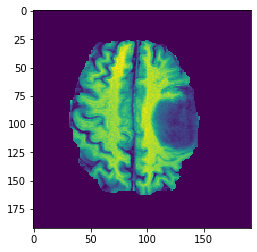

Predicted:- 


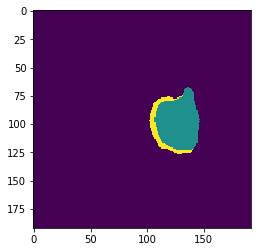

Actual:- 


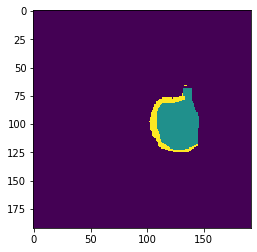

LGG test slice no: 473


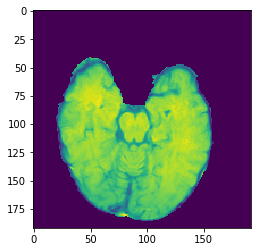

Predicted:- 


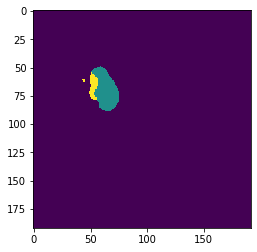

Actual:- 


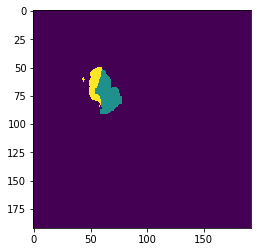

LGG test slice no: 474


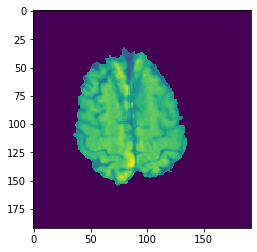

Predicted:- 


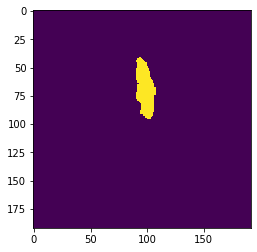

Actual:- 


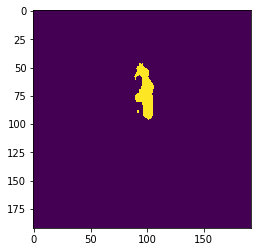

LGG test slice no: 475


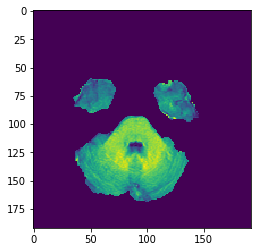

Predicted:- 


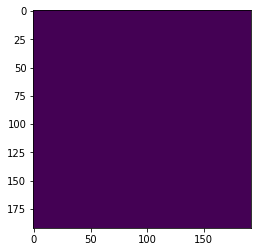

Actual:- 


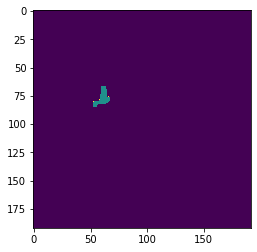

LGG test slice no: 476


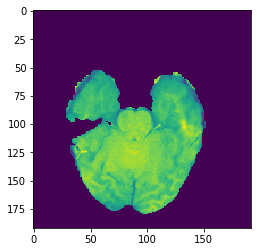

Predicted:- 


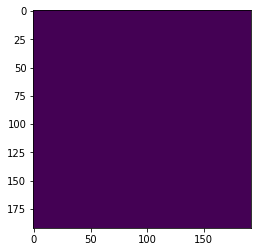

Actual:- 


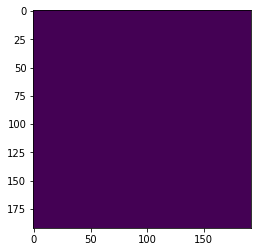

LGG test slice no: 477


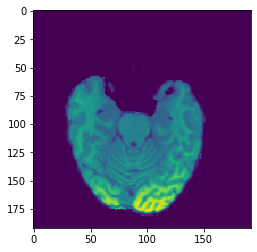

Predicted:- 


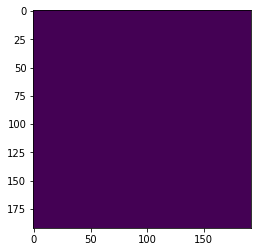

Actual:- 


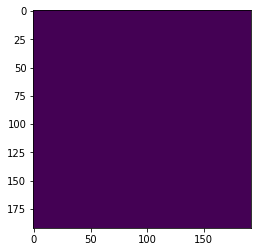

LGG test slice no: 478


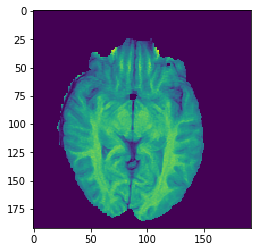

Predicted:- 


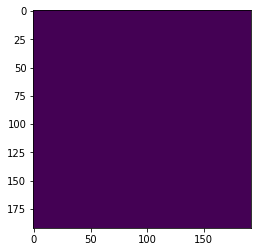

Actual:- 


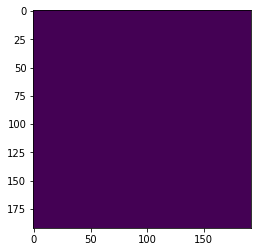

LGG test slice no: 479


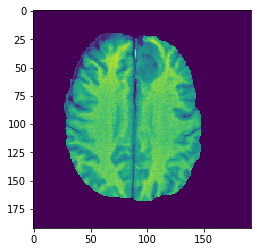

Predicted:- 


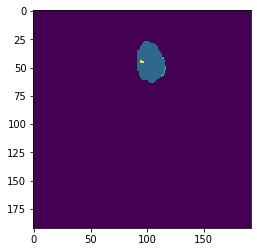

Actual:- 


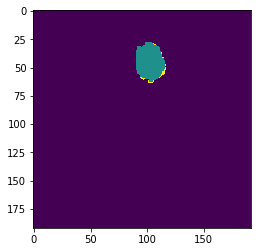

LGG test slice no: 480


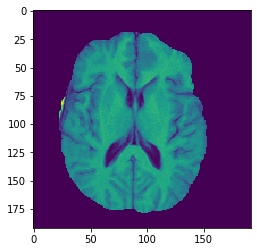

Predicted:- 


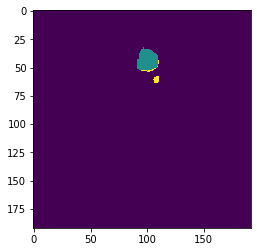

Actual:- 


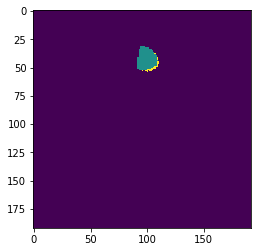

LGG test slice no: 481


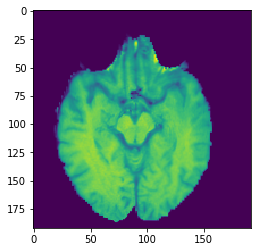

Predicted:- 


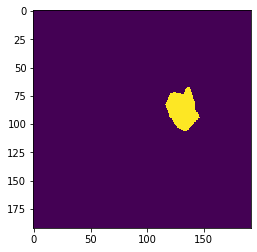

Actual:- 


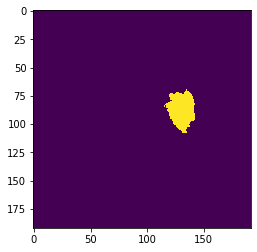

LGG test slice no: 482


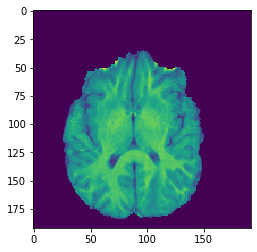

Predicted:- 


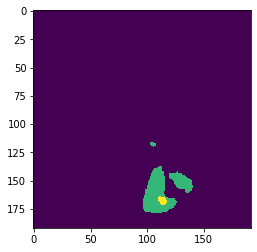

Actual:- 


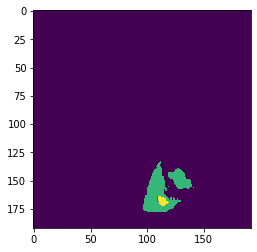

LGG test slice no: 483


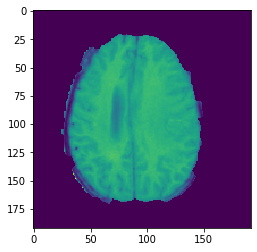

Predicted:- 


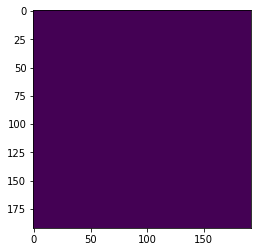

Actual:- 


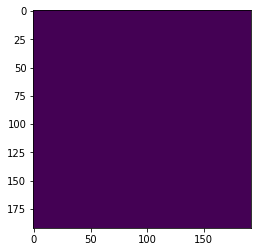

LGG test slice no: 484


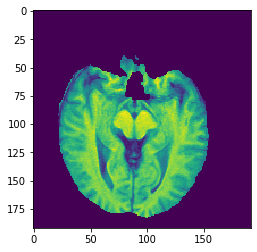

Predicted:- 


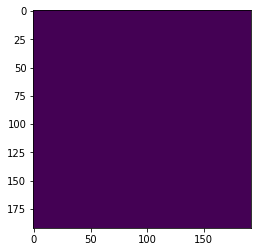

Actual:- 


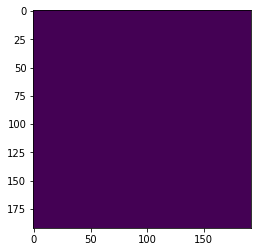

LGG test slice no: 485


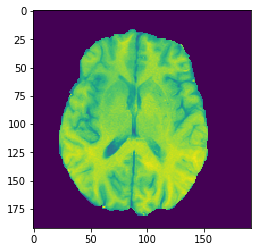

Predicted:- 


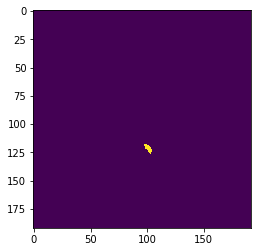

Actual:- 


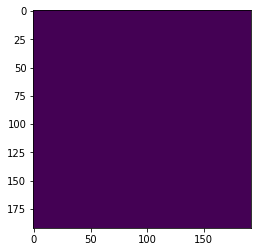

LGG test slice no: 486


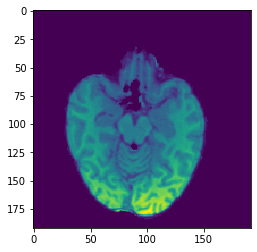

Predicted:- 


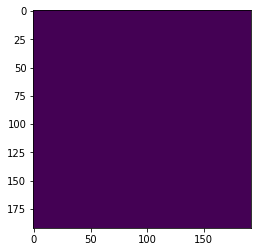

Actual:- 


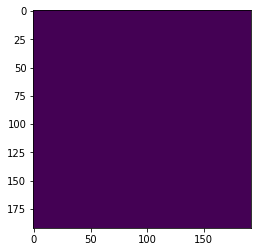

LGG test slice no: 487


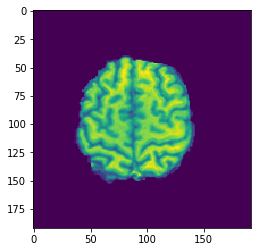

Predicted:- 


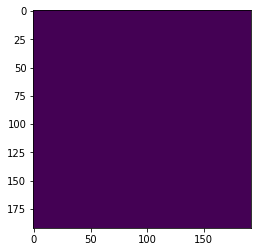

Actual:- 


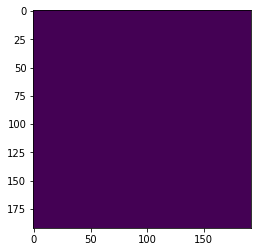

LGG test slice no: 488


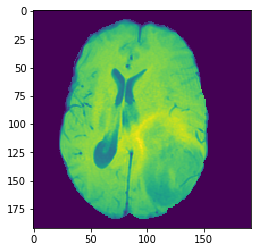

Predicted:- 


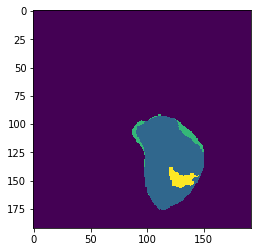

Actual:- 


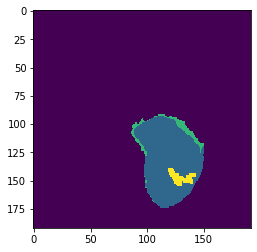

LGG test slice no: 489


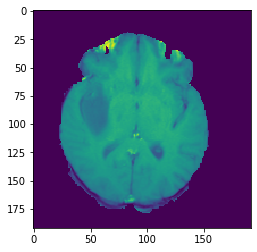

Predicted:- 


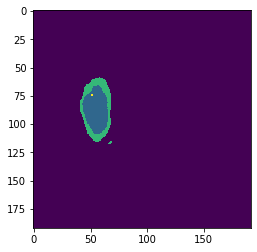

Actual:- 


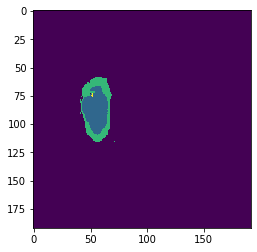

LGG test slice no: 490


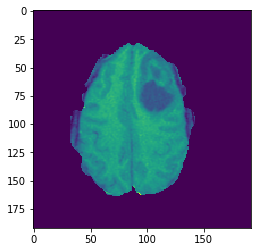

Predicted:- 


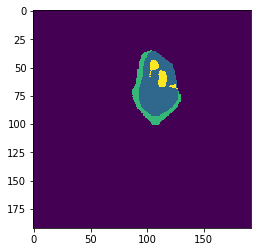

Actual:- 


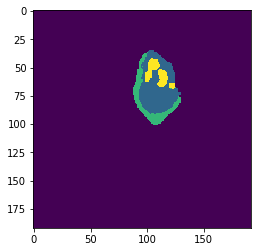

LGG test slice no: 491


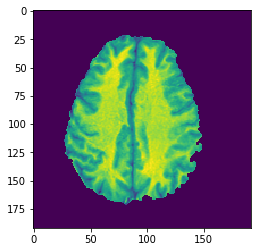

Predicted:- 


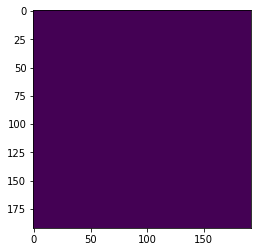

Actual:- 


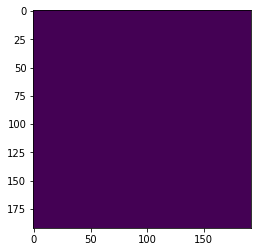

LGG test slice no: 492


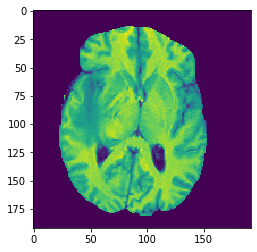

Predicted:- 


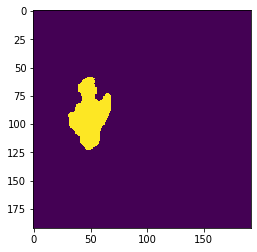

Actual:- 


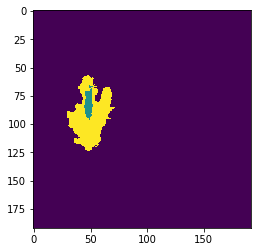

LGG test slice no: 493


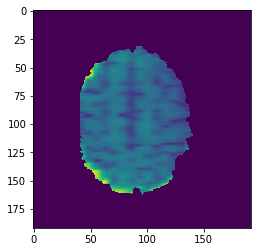

Predicted:- 


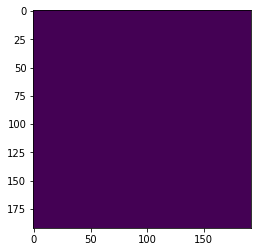

Actual:- 


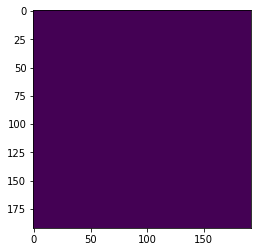

LGG test slice no: 494


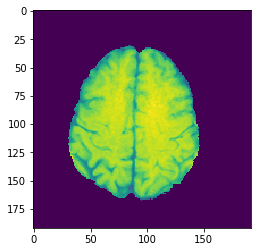

Predicted:- 


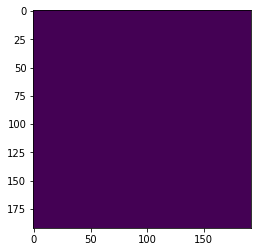

Actual:- 


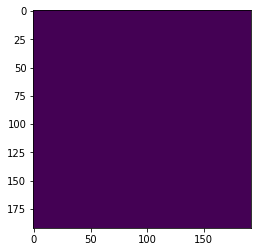

LGG test slice no: 495


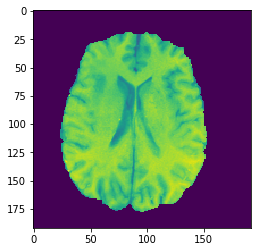

Predicted:- 


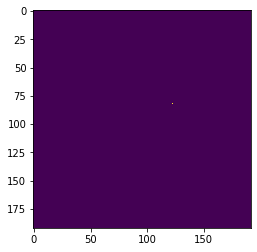

Actual:- 


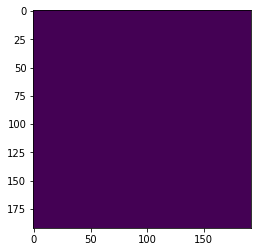

LGG test slice no: 496


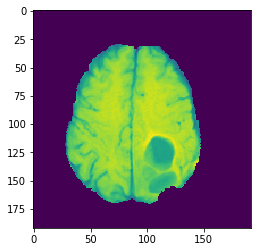

Predicted:- 


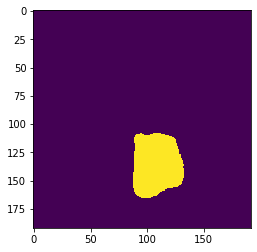

Actual:- 


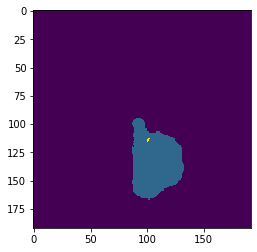

LGG test slice no: 497


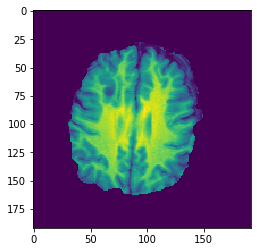

Predicted:- 


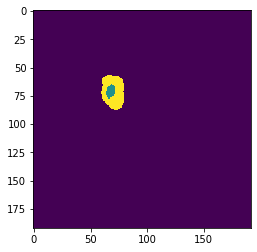

Actual:- 


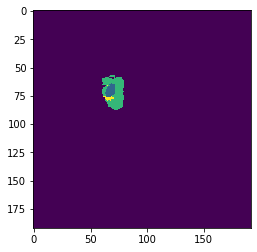

LGG test slice no: 498


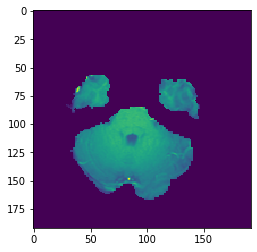

Predicted:- 


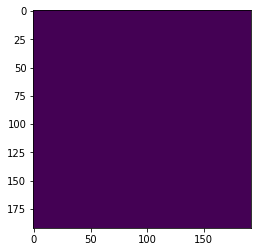

Actual:- 


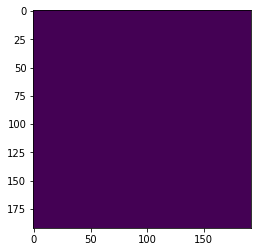

LGG test slice no: 499


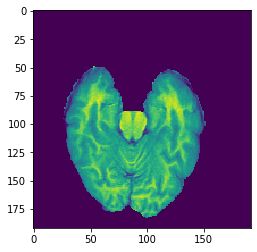

Predicted:- 


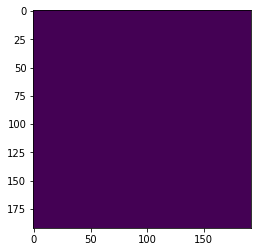

Actual:- 


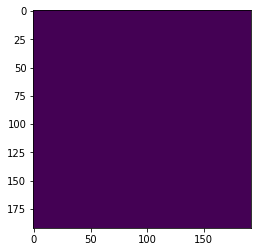

In [ ]:
import matplotlib.pyplot as plt
for i in range(450,500):
  print('HGG test set no: 1 '+ 'slice no: ' + str(i))
  plt.imshow(X_test1[i,:,:,2])
  plt.show()
  print('Predicted:- ')
  plt.imshow(Y_pred1[i,:,:,0])
  plt.show()
  print('Actual:- ')
  plt.imshow(Y_test1[i,:,:,0])
  plt.show()
for i in range(450,500):
  print('HGG test set no: 2 '+ 'slice no: ' + str(i))
  plt.imshow(X_test2[i,:,:,2])
  plt.show()
  print('Predicted:- ')
  plt.imshow(Y_pred2[i,:,:,0])
  plt.show()
  print('Actual:- ')
  plt.imshow(Y_test2[i,:,:,0])
  plt.show()
for i in range(450,500):
  print('HGG test set no: 3 '+ 'slice no: ' + str(i))
  plt.imshow(X_test3[i,:,:,2])
  plt.show()
  print('Predicted:- ')
  plt.imshow(Y_pred3[i,:,:,0])
  plt.show()
  print('Actual:- ')
  plt.imshow(Y_test3[i,:,:,0])
  plt.show()
for i in range(450,500):
  print('LGG test slice no: ' + str(i))
  plt.imshow(X_test4[i,:,:,1])
  plt.show()
  print('Predicted:- ')
  plt.imshow(Y_pred4[i,:,:,0])
  plt.show()
  print('Actual:- ')
  plt.imshow(Y_test4[i,:,:,0])
  plt.show()